# How to Run
1. Data generation and selection (H3.6M) 
   -  Generate the main DataFrame: Load the data from the pipeline (Run the function:   create_df) or Read the data as CSV file
   -  Optional: Generating needed DataFrames for merging later
       -  merge the MPJPE error from different motion prediction models (Run the function:   merge_metrics) 
       -  merge info about the subject and the subaction for each sequence (Run the function:   get_subjects_subactions)
       -  transfer the kinematics from cartesian to spherical coordinates 
       -  create a subset (Run the function: create_df_subset)
       -  Selecting frames, e.g., 10 input, 25 output.(Run the function: n_frames) 
   

2. Data Processing
    -  Dimensionality reduction (Run the function project_PCA) 
    -  Scaling (Run the function: scaling_fn) (optional if you plan to train only one model)
    
    
4. Train model/s. 
   - Option 1: Train a single model. (Run the function: detect_OOD)(set scaling = True if you didn't use scaling_fn)
   - Option 2: Train all the models/for different numbers of frames at once. (Run the function create_metrics_df)(You must scale first)
   
5. Run model/s on a sample from the Loader to get the decision scores.
   - Run decision_fn (Not complete, go to the corresponding section for more details)

6. Analysis toolkit.
    - (A) Simple analysis
    - (B) Generate dataframes with analysis using different thresholds. Use the dataframe from create_metrics_df to Run the functions: create_fast_analysis or general_analysis or get_index
    - (C) Generate two interactive apps for analysis using different thresholds 
    - (D) Kinematics analysis
      - Uses the data from the loader object (must have been created in advance)
      - Plot velocity and acceleration in spherical coordinates
      - Choose, which motion to analyze. Can also analyze all motions (average velocity / acceleration) 
      - Choose, which sequence to analyze. Can also analyze all sequences (average velocity / acceleration)
      - Create objects holding velocity and acceleration information differing between inliers and outliers

# List of functions

**Data generation and selection**

* create_df
* merge_metrics (get_metric)
* get_subjects_subactions

* reshape_for_ml_training
* calculate_spherical_coordinates
* calculate_spherical_velocity
* calculate_spherical_acceleration

* create_df_subset
* n_frames


**Analysis**

* project_PCA
* scaling_fn
* detect_OOD
* get_precision_recall
* visualize_ood

* create_metrics_df
* create_fast_analysis
* general_analysis
* get_index


* tsne_afterOOD
* create_plotly_OOD_tsne

**Kinematics analysis**

Generate data
* calculate_spherical_coordinates
* calculate_spherical_velocity
* calculate_spherical_acceleration
* convert loader to loaderdict
* calculate_vspherical_from_loader
* calculate_aspherical_from_loader
* sample_kinematics
* kinematics_average
* reshape_for_ml_training
* plot_kinematics_spherical

Differ between inliers and outliers:
* differ_inliers
* analyze_inoutliers

Visualize kinematics
* plot_spherical_velocity
* plot_spherical_acceleration

# Import modules

In [1]:
!python3 -m pip install -r requirements.txt

In [2]:
!pip install pyod

In [3]:
!pip install hdbscan

In [4]:
# !pip install openpyxl

In [5]:
# imports for QM pipeline
import analysis
import loaders
import json
from utils import yaml_utils
from pathlib import Path

In [6]:
# additional imports
import os
import pandas as pd 
import numpy as np
import openpyxl
import re
import csv

import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.express as px
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt

In [7]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

from sklearn.manifold import TSNE 
#from sklearn.manifold import locally_linear_embedding

In [8]:
from pyod.models import cblof
from pyod.models import lof
from pyod.models import iforest

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import hdbscan

# Data generation and selection (H3.6M)

## Load the data from the pipeline (if you have access to QM cluster)

**Note 1:** We use the following settings in config/data-analysis-demo.yaml 

* input_n: 10
* output_n: 25
* data_dir: /home/jovyan/datasets/attention/ann_h3.6m/

**Note 2:** We made some changes to load_data_h36m() function in utils/data_utils.py 

The changes are in lines as follows :

0. Insert in line 16-17:

1. Insert in lines 872-873 

2. Insert in lines 913-915

3. Insert in lines 951-955 

* the changes create csv files with information needed to distinguish subjects and subactions
* the csv files are stored in a newly created folder ./subjects_subactions
* they are used in get_subjects_subactions() below to create a data frame with columns for subject and subaction that can be merged

In [9]:
opt = yaml_utils.load_yaml("config/data-analysis-demo.yaml", class_mode=True)
db_set = "train"
if "cmu" in opt.general_config.data_dir: db = "cmu"
elif "h3" in opt.general_config.data_dir: db = "h36m"
elif "3d" in opt.general_config.data_dir: db = "3dpw"
elif "amas" in opt.general_config.data_dir: db = "amass"
elif "ex" in opt.general_config.data_dir: db = "expi"
dim_used = json.load(open(f'stats/{db}_train_stats.json'))["dim_used"]

In [10]:
# create folder to store csv with information on subjects and subactions separately
directory = './subjects_subactions'
if not os.path.exists(directory):
    os.mkdir(directory)

In [11]:
# loader = loaders.get_loader(opt, split="test", model=None, return_all_joints=True, )
loader, actions = loaders.get_loader_divided_by_actions(db, db_set, opt, shuffle=False, return_class=True)

action: walking
data loaded successfully!!!
train data: 15523 | batches:61
supported input:10, output:25
action: eating
data loaded successfully!!!
train data: 13212 | batches:52
supported input:10, output:25
action: smoking
data loaded successfully!!!
train data: 17364 | batches:68
supported input:10, output:25
action: discussion
-- inverted poses: 2674 poses, 0.14 --
data loaded successfully!!!
train data: 19088 | batches:75
supported input:10, output:25
action: directions
data loaded successfully!!!
train data: 11288 | batches:45
supported input:10, output:25
action: greeting
data loaded successfully!!!
train data: 8461 | batches:34
supported input:10, output:25
action: phoning
-- inverted poses: 1918 poses, 0.13 --
data loaded successfully!!!
train data: 15030 | batches:59
supported input:10, output:25
action: posing
data loaded successfully!!!
train data: 8247 | batches:33
supported input:10, output:25
action: purchases
data loaded successfully!!!
train data: 6123 | batches:24
sup

In [12]:
print(actions)

['walking', 'eating', 'smoking', 'discussion', 'directions', 'greeting', 'phoning', 'posing', 'purchases', 'sitting', 'sittingdown', 'takingphoto', 'waiting', 'walkingdog', 'walkingtogether']


### Generate the main dataframe 

#### Needed function

In [13]:
def create_df(loader_vr,actions_vr):
    df = pd.DataFrame()
    frame_no = loader[actions[0]].dataset.target.shape[1]
    joint_no = loader[actions[0]].dataset.target.shape[2]
    dim_no = loader[actions[0]].dataset.target.shape[3]
    for action in actions_vr:
        df_action =  pd.DataFrame(loader_vr[action].dataset.target.reshape(-1, frame_no*joint_no*dim_no))
        df_action['action'] = action
        print(f'dataframe for {action} is created, with shape {df_action.shape}')
        df = pd.concat([df,df_action])

    df.reset_index(inplace = True)
    df.rename(columns = {'index':'idx'}, inplace = True)
    return df

#### Apply function

In [14]:
df = create_df(loader, actions)
df.shape

dataframe for walking is created, with shape (15523, 3361)
dataframe for eating is created, with shape (13212, 3361)
dataframe for smoking is created, with shape (17364, 3361)
dataframe for discussion is created, with shape (19088, 3361)
dataframe for directions is created, with shape (11288, 3361)
dataframe for greeting is created, with shape (8461, 3361)
dataframe for phoning is created, with shape (15030, 3361)
dataframe for posing is created, with shape (8247, 3361)
dataframe for purchases is created, with shape (6123, 3361)
dataframe for sitting is created, with shape (13330, 3361)
dataframe for sittingdown is created, with shape (13495, 3361)
dataframe for takingphoto is created, with shape (8012, 3361)
dataframe for waiting is created, with shape (11849, 3361)
dataframe for walkingdog is created, with shape (9780, 3361)
dataframe for walkingtogether is created, with shape (9275, 3361)


(180077, 3362)

In [15]:
df

,idx,0,1,2,3,4,5,6,7,8,...,3351,3352,3353,3354,3355,3356,3357,3358,3359,action
0,0,0.0,0.0,0.0,-132.948593,0.0,0.0,-71.220520,-419.464447,128.042419,...,-181.947159,-22.737667,168.040588,-271.321167,-167.278503,173.182098,-271.321167,-167.278503,173.182098,walking
1,1,0.0,0.0,0.0,-132.948593,0.0,0.0,-70.484131,-419.032593,129.095047,...,-178.740585,-4.046036,171.578186,-263.914917,-150.079437,189.627869,-263.914917,-150.079437,189.627869,walking
2,2,0.0,0.0,0.0,-132.948593,0.0,0.0,-69.480377,-418.509003,130.298279,...,-177.020660,5.623371,177.738220,-256.131927,-143.127686,200.558014,-256.131927,-143.127686,200.558014,walking
3,3,0.0,0.0,0.0,-132.948593,0.0,0.0,-71.031143,-419.365570,128.274734,...,-180.672516,5.287796,180.672409,-253.996017,-146.903290,199.848907,-253.996017,-146.903290,199.848907,walking
4,4,0.0,0.0,0.0,-132.948593,0.0,0.0,-71.140823,-419.001740,129.510544,...,-188.729553,-0.598873,175.682297,-258.405548,-155.036621,189.840027,-258.405548,-155.036621,189.840027,walking
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180072,9270,0.0,0.0,0.0,-132.948593,0.0,0.0,-62.127251,-408.610870,155.490036,...,-253.459503,-87.717972,101.861687,-322.156219,-234.509262,50.487801,-322.156219,-234.509262,50.487801,walkingtogether
180073,9271,0.0,0.0,0.0,-132.948593,0.0,0.0,-61.747795,-409.300018,153.491302,...,-247.771896,-91.627045,101.295273,-315.135162,-239.279099,50.627060,-315.135162,-239.279099,50.627060,walkingtogether
180074,9272,0.0,0.0,0.0,-132.948593,0.0,0.0,-62.727547,-406.591156,160.960480,...,-243.455536,-93.562233,104.733040,-308.625122,-242.246262,54.213894,-308.625122,-242.246262,54.213894,walkingtogether
180075,9273,0.0,0.0,0.0,-132.948593,0.0,0.0,-64.083931,-405.183807,165.043610,...,-232.670502,-94.647728,106.416100,-305.093658,-241.748444,61.444275,-305.093658,-241.748444,61.444275,walkingtogether


### Export/Import the loader object into/from a CSV file.

NOTE. Run this section only if you want to run the Kinematic analysis and you don't have access to the Loader object from the cluster 

#### Define functions

In [ ]:
def save_loader_to_csv(loaderDict, file_path):
    """
    Save a dictionary with 4D numpy arrays to a CSV file.

    Args:
        loader (dict): The dictionary containing the data.
        file_path (str): The path to the CSV file to be saved.
    """
    
    
    with open(file_path, 'w', newline='') as csv_file:
        writer = csv.writer(csv_file)
        writer.writerow(['actions', 'data'])

        for action in actions:
            loader_item = loader[action].dataset.target
            flattened_array = loader_item.flatten()  # Flatten the 4D numpy array
            writer.writerow([action, *flattened_array])
            
def save_dimensions_to_csv(loader, dimensions_file_path):
    """
    Save the dimensions of LoaderItem instances to a CSV file.

    Args:
        loader (dict): The dictionary containing the loader data.
        dimensions_file_path (str): The path to the CSV file to save dimensions.
    """
    with open(dimensions_file_path, 'w', newline='') as csv_file:
        writer = csv.writer(csv_file)
        writer.writerow(['actions', 'dimensions'])

        for action in loader:
            dimensions = loader[action].dataset.target.shape
            writer.writerow([action, *dimensions])

In [ ]:
def read_csv_to_loader(file_path, dimensions_file_path):
    """
    Read a CSV file containing data and dimensions, and convert it into a loader object with LoaderItem instances.

    Args:
        file_path (str): The path to the CSV file to be read.
        dimensions_file_path (str): The path to the CSV file containing dimensions.

    Returns:
        dict: The dictionary containing the loader data.
        list: The list of actions.
    """
    loaderDict = {}
    actions = []

    with open(dimensions_file_path, 'r') as dimensions_csv_file:
        dimensions_reader = csv.reader(dimensions_csv_file)
        next(dimensions_reader)  # Skip the header row

        dimensions_dict = {row[0]: tuple(map(int, row[1:])) for row in dimensions_reader}

    with open(file_path, 'r') as csv_file:
        reader = csv.reader(csv_file)
        next(reader)  # Skip the header row

        for row in reader:
            action = row[0]
            actions.append(action)
            dimensions = dimensions_dict.get(action, None)
            if dimensions is None:
                print(f"Dimensions not found for action: {action}")
                continue
            
            data_values = np.array([float(val) for val in row[1:]])
            array_shape = dimensions
            array = data_values.reshape(array_shape)
            loader_item = array # LoaderItem(array, dimensions)
            loaderDict[action] = loader_item
            print(f"Action {action} loaded successfully")

    return loaderDict, actions

#### Apply functions

In [ ]:
save_loader_to_csv(loader, "loaderDict.csv")

In [ ]:
save_dimensions_to_csv(loader, "dimensions.csv")

In [ ]:
loaderDict, actions = read_csv_to_loader("loaderDict.csv", "dimensions.csv")
print("Actions:", actions)

In [ ]:
action_to_access = 'walking'
if action_to_access in loaderDict:
    loader_item = loaderDict[action_to_access]
    dimensions = loaderDict[action_to_access].shape
    # print("Loaded Loader Item for", action_to_access, ":", loader_item)
    print("Dimensions for", action_to_access, ":", dimensions)
else:
    print("Action", action_to_access, "not found in the loaded loader.")

## Read The dataframe from CSV file (if you are running on google colab)

In [ ]:
df = pd.read_csv('df_H36M_35frames.csv').drop(columns= ['Unnamed: 0'])
df

## Generating Needed Dataframes for merging in the next section 

Note: Only load the one you need.  

### Create the data frame with selected error metric (mpjpe) from different models
Note. you need to choose at least on motion model.

#### Needed function

In [16]:
def merge_metrics(models, type_, actions, metric):
    def get_metric(file, model, type_, actions, metric):
        # actions has to be a list, even if just one action
        # file // defined within merge_metrics
        # type, metric are strings

        selected_sheets = [f"{type_}-{action}-{metric}" for action in actions]
        dfs_list = []

        # open the workbook in read-only mode
        workbook = openpyxl.load_workbook(file, read_only=True)

        for selected_sheet, action in zip(selected_sheets, actions):

            # check if the selected sheet exists in the workbook
            if selected_sheet in workbook.sheetnames:
                sheet = workbook[selected_sheet]

                # convert the sheet into a df
                data = sheet.values
                columns = next(data)
                df = pd.DataFrame(data, columns=columns)
                df = df.rename(columns={df.columns[0]: "idx"})

                df.insert(1, "action", action)

                # add a model suffix to column names (except "idx" and "action")
                model_suffix = f"_{metric}_{model}"
                column_names = df.columns[2:] + model_suffix
                df.columns = df.columns[:2].tolist() + column_names.tolist()

                dfs_list.append(df[:-6])  # the last six values are the per frame/ms or the per joint mean, std, min, max, q50, q75
                # they do not fit the data structure (rows = idxs) and they can be directly calculated from the columns we have using .describe()

            else:
                raise ValueError(f"Sheet '{selected_sheet}' not found in the Excel file.")

        df_combined = pd.concat(dfs_list, ignore_index=True)
        df_combined["idx"] = df_combined["idx"].astype("int")

        workbook.close()

        return df_combined

    dfs_list = []

    for model in models:
        file = f"/home/jovyan/notebooks/testing_repos/metrics/H36M_samples_train__{model}_test.xlsx"
        print(f"start creating df for {model}")
        df_model = get_metric(file, model, type_, actions, metric)
        dfs_list.append(df_model)
        print(f"finished creating df for {model}")

    # merge dfs in dfs_list based on "idx" and "action"
    df_result = dfs_list[0]  # Initialize with the first DataFrame
    for df_model in dfs_list[1:]:
        df_result = pd.merge(df_result, df_model, on=["idx", "action"])
    print("merged dfs for different models")
        
    return df_result

#### Apply function

In [17]:
models = ["STSGCN", "motionmixer"]  # add more models as needed
type_ = "S-A"
actions = actions  # already defined from the loader
metric = "mpjpe"

df_sa_mpjpe = merge_metrics(models, type_, actions, metric)

start creating df for STSGCN
finished creating df for STSGCN
start creating df for motionmixer
finished creating df for motionmixer
merged dfs for different models


In [18]:
df_sa_mpjpe

,idx,action,40 ms_mpjpe_STSGCN,80 ms_mpjpe_STSGCN,120 ms_mpjpe_STSGCN,160 ms_mpjpe_STSGCN,200 ms_mpjpe_STSGCN,240 ms_mpjpe_STSGCN,280 ms_mpjpe_STSGCN,320 ms_mpjpe_STSGCN,...,880 ms_mpjpe_motionmixer,920 ms_mpjpe_motionmixer,960 ms_mpjpe_motionmixer,1000 ms_mpjpe_motionmixer,mean_mpjpe_motionmixer,std_mpjpe_motionmixer,min_mpjpe_motionmixer,max_mpjpe_motionmixer,quantile .50_mpjpe_motionmixer,quantile .75_mpjpe_motionmixer
0,3957,walking,18.295492,27.779243,53.610435,83.983200,116.460464,151.369934,186.135193,216.175476,...,413.705200,412.421631,409.144562,405.501404,294.720197,147.325752,12.635899,420.518250,383.721954,413.705200
1,3956,walking,25.320011,32.134777,55.446922,81.374741,109.836182,139.312973,172.814713,202.990417,...,408.624207,407.177338,405.685638,402.433777,289.121133,141.517163,14.618099,416.008728,359.773254,407.825134
2,3958,walking,21.051807,22.241631,47.412689,80.592636,116.564316,151.368378,185.123138,216.600464,...,402.857086,399.842712,395.886383,390.538727,290.497376,144.579704,11.582167,407.598145,389.505981,403.944397
3,3955,walking,26.303284,31.977739,50.308266,75.924332,102.627861,130.831451,160.323059,190.034546,...,412.656738,412.585297,411.193726,409.829346,277.508621,147.545560,13.873846,418.778992,331.971924,411.845093
4,3954,walking,22.557735,25.286392,41.715034,67.076233,93.986465,121.206993,149.482483,177.110138,...,410.154968,410.905457,410.786743,409.645294,270.390442,147.366838,10.689402,418.147003,314.668610,410.154968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180072,5863,walkingtogether,16.182796,12.576055,13.510149,15.559605,19.957218,19.010702,21.425495,21.289591,...,35.076054,33.146214,32.127899,33.056229,26.377368,8.806116,5.963050,35.932186,30.166672,32.900726
180073,5462,walkingtogether,14.262196,12.515732,13.426291,15.211062,17.141083,18.206837,19.109564,19.513086,...,42.188679,44.069702,45.338959,44.243305,27.904870,11.823170,7.673163,45.338959,31.195490,34.580208
180074,8351,walkingtogether,13.022432,14.234219,22.657959,26.816622,24.373852,19.528614,20.005558,18.384457,...,22.288048,24.139357,27.672014,30.217003,20.310213,4.469573,6.813609,30.217003,20.610424,22.116085
180075,8353,walkingtogether,10.818668,10.575874,10.869095,14.245225,21.835089,22.498016,21.690477,24.180630,...,27.104771,27.115620,28.165310,27.777374,22.759857,6.038241,5.335997,29.588665,24.643276,26.147383


### Create the data frame with subject and subaction 
Note. Generate this part if you are planing to plot:
* Scatter plot of decision score vs start time of subsequence by outlier status for an OOD model,
* Scatter plot of mean MPJPE vs start time of subsequence by outlier status for an OOD model, 

which are the 5th and 6th plots of the function  visualize_ood. 

#### define functions

In [19]:
def get_subjects_subactions():
    dfs = [] 
    for action in actions:
        path = "subjects_subactions/"
        file = f"df_{action}_subjects_subactions.csv"
        df = pd.read_csv(path+file)
        dfs.append(df)
        
    df_subjects_subactions = pd.concat(dfs, ignore_index=True)
        
    # create a new column expand by which the rows must be expaned to get to 180077 
    # this is last_index for the zero row within each action and last_index.lead - last_index for the other rows, i.e. the differences in last_index
    grouped = df_subjects_subactions.groupby('action')
    df_subjects_subactions['expand'] = df_subjects_subactions['last_index'] - grouped['last_index'].shift(1)
    df_subjects_subactions['expand'].fillna(df_subjects_subactions['last_index'], inplace=True)
    df_subjects_subactions['expand'] = df_subjects_subactions['expand'].astype(int)
        
    # expand rows by creating and appending duplicates in the range provided by the expand column
    expanded_rows = []
    for _, row in df_subjects_subactions.iterrows():
        for i in range(row['expand']):
            expanded_rows.append([row['subject'], row['action'], row['subaction'], row['last_index'], row['expand'], i])

    df_subjects_subactions = pd.DataFrame(expanded_rows, columns=['subject', 'action', 'subaction', 'last_index', 'expand', 'i'])
    df_subjects_subactions["idx"] = df_subjects_subactions.groupby('action').cumcount()
    df_subjects_subactions = df_subjects_subactions[["idx", "action", "subject", "subaction"]]
    
    df_subjects_subactions["subseq_subject_subaction"] = df_subjects_subactions.groupby(["action", "subject", "subaction"]).cumcount()
    df_subjects_subactions["min_time_ms"] = ((df_subjects_subactions["subseq_subject_subaction"]+1)/25) * 1000
    df_subjects_subactions["max_time_ms"] = ((df_subjects_subactions["subseq_subject_subaction"]+35)/25) * 1000

    return df_subjects_subactions

#### apply functions

In [20]:
df_subjects_subactions = get_subjects_subactions()
df_subjects_subactions.shape

(180077, 7)

In [21]:
df_subjects_subactions

,idx,action,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms
0,0,walking,1,1,0,40.0,1400.0
1,1,walking,1,1,1,80.0,1440.0
2,2,walking,1,1,2,120.0,1480.0
3,3,walking,1,1,3,160.0,1520.0
4,4,walking,1,1,4,200.0,1560.0
...,...,...,...,...,...,...,...
180072,9270,walkingtogether,9,2,813,32560.0,33920.0
180073,9271,walkingtogether,9,2,814,32600.0,33960.0
180074,9272,walkingtogether,9,2,815,32640.0,34000.0
180075,9273,walkingtogether,9,2,816,32680.0,34040.0


### Read the data frame with subject and subaction from csv file 

* only run this if you work outside the cluster and need to load the data from csv files

In [24]:
df_subjects_subactions = pd.read_csv("df_subjects_subactions.csv").drop(columns= ["Unnamed: 0"])
df_subjects_subactions

,idx,action,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms
0,0,walking,1,1,0,40.0,1400.0
1,1,walking,1,1,1,80.0,1440.0
2,2,walking,1,1,2,120.0,1480.0
3,3,walking,1,1,3,160.0,1520.0
4,4,walking,1,1,4,200.0,1560.0
...,...,...,...,...,...,...,...
180072,9270,walkingtogether,9,2,813,32560.0,33920.0
180073,9271,walkingtogether,9,2,814,32600.0,33960.0
180074,9272,walkingtogether,9,2,815,32640.0,34000.0
180075,9273,walkingtogether,9,2,816,32680.0,34040.0


###  Transfering the motions from cartesian to spherical space and calculating velocities and accelerations

Note. Generate this part if you want to use the Kinematic analysis toolkit

#### Define Functions

##### Calculate velocity and acceleration in spherical coordinate system

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
#warnings.filterwarnings("default", category=RuntimeWarning)

def calculate_spherical_coordinates(loader_item):
    xy = loader_item

    joint_no = 32  # 32 joints in H3.6M
    dims = 3  # 3 dims (x, y, z)

    sequence_no, frame_no, _, _ = xy.shape

    r_cube = np.empty((sequence_no, frame_no, joint_no))
    phi_cube = np.empty((sequence_no, frame_no, joint_no))
    theta_cube = np.empty((sequence_no, frame_no, joint_no))

    for sequence in range(sequence_no):
        x = xy[sequence, :, :, 0]
        y = xy[sequence, :, :, 1]
        z = xy[sequence, :, :, 2]

        squared_sum = np.sum(np.square(xy[sequence]), axis=-1)
        r = np.sqrt(squared_sum)
        r_cube[sequence] = r

        phi = np.arccos(z / r)
        phi = np.nan_to_num(phi, nan=0)
        phi_cube[sequence] = phi

        theta = np.arctan2(y, x)
        theta = np.nan_to_num(theta, nan=0)
        theta_cube[sequence] = theta

    return r_cube, theta_cube, phi_cube

def calculate_spherical_velocity(loader_item):

    delta_t = 0.04      # 25 frames per second, unit [1/s]
    delta_joint_dim = 32 * 3

    # calculate the spherical coordinates from the given sequence
    r_cube, phi_cube, theta_cube = calculate_spherical_coordinates(loader_item)

    r2, phi2, theta2 = r_cube[:,1:], phi_cube[:, 1:], theta_cube[:, 1:]  # Exclude the first row
    r1, phi1, theta1 = r_cube[:, :-1], phi_cube[:, :-1], theta_cube[:, :-1]  # Exclude the last row

    # calculate velocities
    v_r_cube = (r2 - r1) / delta_t                  # radial velocity, unit of [mm / s]
    v_theta_cube = (theta2 - theta1) / delta_t      # inclination velocity, unit of [rad / s]
    v_phi_cube = (phi2 - phi1) / delta_t            # azimuth velocity, unit of [rad / s]

    return v_r_cube, v_theta_cube, v_phi_cube

def calculate_spherical_acceleration(loader_item):
    # equivalent to the loader object, just for accelerations. The radial (r), inclination (theta) and azimuth (phi) acceleration for each action are stored in a tuple.
    # the tuple can then be accessed using the designated action.  
    delta_t = 0.04        # working with 25 frames per second

    v_r_cube, v_theta_cube, v_phi_cube = calculate_spherical_velocity(loader_item)

    # calculate the spherical velocity of the given sequence
    v_r2, v_phi2, v_theta2 = v_r_cube[:,1:], v_phi_cube[:,1:], v_theta_cube[:,1:]
    v_r1, v_phi1, v_theta1 = v_r_cube[:,:-1], v_phi_cube[:,:-1], v_theta_cube[:,:-1]

    # proposed by chatgpt. Results highly questionable, as not even the unit seems to be correct
    a_r_cube = (v_r2 - v_r1) / delta_t                # radial acceleration in mm / s^2
    a_theta_cube = (v_theta2 - v_theta1) / delta_t    # inclination acceleration in rad / s^2
    a_phi_cube = (v_phi2 - v_phi1) / delta_t          # azimuthal acceleration in rad / s^2

    return a_r_cube, a_theta_cube, a_phi_cube 

def convert_loader_to_loaderDict(loader, actions = actions):
    loaderDict = {}
    for action in actions:
        loaderDict[action] = loader[action].dataset.target
    return loaderDict

def calculate_vspherical_from_loader(loaderDict, actions = actions):
    # equivalent to the loader object, just for velocities. The radial (r), inclination (theta) and azimuth (phi) velocity for each action are stored in a tuple.
    # the tuple can then be accessed using the designated action.  
    velocities_dict = {}
    for action in actions:
        loader_item = loaderDict[action]

        v_r_cube, v_theta_cube, v_phi_cube = calculate_spherical_velocity(loader_item)

        velocities_dict[action] = [v_r_cube, v_phi_cube, v_theta_cube]
        print (f"velocities calculated for {action}")
    return velocities_dict

def calculate_aspherical_from_loader(loaderDict, actions = actions):
    # equivalent to the loader object, just for velocities
    accelerations_dict = {}
    for action in actions:
        loader_item = loaderDict[action]

        a_r_cube, a_theta_cube, a_phi_cube = calculate_spherical_acceleration(loader_item)

        accelerations_dict[action] = [a_r_cube, a_phi_cube, a_theta_cube]
        print (f"accelerations calculated for {action}")
    return accelerations_dict

def sample_kinematics(kinematics_dict, action, sample, area = True):        # extract velocity or acceleration of single samples   
    # can be fed with either a velocities_dict or an accelerations_dict
    # a velocities_dict with only one action type should be passed to this function
    k_r_cube, k_theta_cube, k_phi_cube = kinematics_dict[action]
    sample_length = k_r_cube.shape[1]
    if area == True:
        k_r_prior, k_theta_prior, k_phi_prior = pd.DataFrame(k_r_cube[sample-sample_length]), pd.DataFrame(k_theta_cube[sample-sample_length]), pd.DataFrame(k_phi_cube[sample-sample_length])
        k_r_spot, k_theta_spot, k_phi_spot = pd.DataFrame(k_r_cube[sample]), pd.DataFrame(k_theta_cube[sample]), pd.DataFrame(k_phi_cube[sample])
        k_r_next, k_theta_next, k_phi_next = pd.DataFrame(k_r_cube[sample+sample_length]), pd.DataFrame(k_theta_cube[sample+sample_length]), pd.DataFrame(k_phi_cube[sample+sample_length])
        
        k_r = pd.concat([k_r_prior, k_r_spot, k_r_next])
        k_theta = pd.concat([k_theta_prior, k_theta_spot, k_theta_next])
        k_phi = pd.concat([k_phi_prior, k_phi_spot, k_phi_next])          
    else:                    
        k_r, k_theta, k_phi = pd.DataFrame(k_r_cube[sample]), pd.DataFrame(k_theta_cube[sample]), pd.DataFrame(k_phi_cube[sample])
    kinematics = [k_r, k_theta, k_phi]
    
    return kinematics

def kinematics_average(kinematics_dict, actions):           # calculate average of velocity or acceleration 
    # can be fed with either a velocities_dict or an accelerations_dict
    # Can also be fed with a kinematics_dict containing multiple actions
    
    k_rcube_list = []
    k_thetacube_list = []
    k_phicube_list = []

    for action in actions:
        k_r_cube, k_theta_cube, k_phi_cube = kinematics_dict[action] 
        k_rcube_list.append(k_r_cube)
        k_thetacube_list.append(k_theta_cube)
        k_phicube_list.append(k_phi_cube)
    k_r_cube = np.vstack(k_rcube_list)
    k_theta_cube = np.vstack(k_thetacube_list)
    k_phi_cube = np.vstack(k_phicube_list)

    k_r_average, k_theta_average, k_phi_average = pd.DataFrame(np.mean(k_r_cube, axis = 0)), pd.DataFrame(np.mean(k_theta_cube, axis = 0)), pd.DataFrame(np.mean(k_phi_cube, axis = 0))
    kinematics = [k_r_average, k_theta_average, k_phi_average]
    return kinematics


##### Flattening the 4D velocity and acceleration data object to fit into a DataFrame (to be used in an ML model)

In [ ]:
def reshape_for_ml_training(loaderDict, result, samples = None):
    action_list = list(loader.keys())
    list_all_actions = []

    for action in action_list:
        loader_item = loaderDict[action][:samples]

        df_rows = []

        if result == "coordinates":
            r_cube, theta_cube, phi_cube = calculate_spherical_coordinates(loader_item)

            flattened_sequence = np.column_stack([r_cube.flatten(order="C"),
                                                 theta_cube.flatten(order="C"),
                                                 phi_cube.flatten(order="C")])

            df_row = pd.DataFrame(flattened_sequence.reshape(r_cube.shape[0], 3 * r_cube.shape[1] * r_cube.shape[2]))
            df_rows.append(df_row)

        elif result == "velocity":
            v_r_cube, v_theta_cube, v_phi_cube = calculate_spherical_velocity(loader_item)
            flattened_sequence = np.column_stack([v_r_cube.flatten(order="C"),
                                                 v_theta_cube.flatten(order="C"),
                                                 v_phi_cube.flatten(order="C")])

            df_row = pd.DataFrame(flattened_sequence.reshape(v_r_cube.shape[0], 3 * v_r_cube.shape[1] * v_r_cube.shape[2]))
            df_rows.append(df_row)
        
        elif result == "acceleration":
            a_r_cube, a_theta_cube, a_phi_cube = calculate_spherical_acceleration(loader_item)
            flattened_sequence = np.column_stack([a_r_cube.flatten(order="C"),
                                                 a_theta_cube.flatten(order="C"),
                                                 a_phi_cube.flatten(order="C")])

            df_row = pd.DataFrame(flattened_sequence.reshape(a_r_cube.shape[0], 3 * a_r_cube.shape[1] * a_r_cube.shape[2]))
            df_rows.append(df_row)

        df_per_loader_item = pd.concat(df_rows)
        df_per_loader_item["action"] = action
        list_all_actions.append(df_per_loader_item)

    df_for_all_actions = pd.concat(list_all_actions)
        #    return pd.concat(df_rows)
    df_for_all_actions.reset_index(inplace=True)
    df_for_all_actions = df_for_all_actions.rename(columns={'index': 'idx'})
    return df_for_all_actions

##### Plot Velocities and Accelerations

In [ ]:
# joint names, used for visuals
H36M_NAMES = ['']*32
H36M_NAMES[0]  = 'Hip'
H36M_NAMES[1]  = 'Right Hip'
H36M_NAMES[2]  = 'Right Knee'
H36M_NAMES[3]  = 'Right Foot'
H36M_NAMES[4]  = 'Right FootTip'
H36M_NAMES[6]  = 'Left Hip'
H36M_NAMES[7]  = 'Left Knee'
H36M_NAMES[8]  = 'Left Foot'
H36M_NAMES[12] = 'Spine'
H36M_NAMES[13] = 'Thorax'
H36M_NAMES[14] = 'Neck/Nose'
H36M_NAMES[15] = 'Head'
H36M_NAMES[17] = 'Left Shoulder'
H36M_NAMES[18] = 'Left Elbow'
H36M_NAMES[19] = 'Left Wrist'
H36M_NAMES[25] = 'Right Shoulder'
H36M_NAMES[26] = 'Right Elbow'
H36M_NAMES[27] = 'Right Wrist'

def plot_kinematics_spherical(kinematics, type = "velocity", title_text = "Please provide a title for the plot"):
        
        k_r, k_theta, k_phi = kinematics
        
        # initialize graph
        fig_kspherical = make_subplots(rows=3, cols=1, subplot_titles=(f"Radial {type} / moving towards body", f"Inclination {type} / up or down", f"Azimuth {type} / left or right"), shared_xaxes=True)

        # Make subplots
        fig_kr = go.Figure()
        fig_kphi = go.Figure()
        fig_ktheta = go.Figure()

        # select rows / joints to plot
        plot_columns = [3,8,19,27]
        colors = ["#ae0001", "#2a623d", "#222f5b", "#ecb939"]

        row_j = 0

        for column_i in plot_columns:

                ### plot 1

            # Add traces to first plot
            fig_kspherical.add_trace(go.Scatter(y = k_r.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "1"),
                                     row = 1, col = 1)

            fig_kspherical.add_vline(x=10, row = 1, col = 1, line_color = "orange", line_dash="dash")

                ### plot 2

            # add traces to second plot
            fig_kspherical.add_trace(go.Scatter(y = k_theta.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "3"),
                                     row = 2, col = 1)

            fig_kspherical.add_vline(x=10, row = 2, col = 1, line_color = "orange", line_dash="dash")

                ### plot 3

            # add traces to third plot / azimuth
            fig_kspherical.add_trace(go.Scatter(y = k_phi.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "2"),
                                     row = 3, col = 1)

            fig_kspherical.add_vline(x=10, row = 3, col = 1, line_color = "orange", line_dash="dash")

        # Update layout and axis properties
        fig_kspherical.update_layout(height=800, width=800,
                                   title_text= title_text,
                                   legend_tracegroupgap=160)
        fig_kspherical.update_xaxes(title_text="Frame No", row=3, col=1)

        fig_kspherical.update_yaxes(title_text="[mm/s]", row=1, col=1)
        fig_kspherical.update_yaxes(title_text="[rad/s]", row=2, col=1)
        fig_kspherical.update_yaxes(title_text="[rad/s]", row=3, col=1)

        fig_kspherical.show()

#### Apply functions

##### Reshaping Data objects to fit in a DataFrame

In [ ]:
df_sc = reshape_for_ml_training(loaderDict, result = "coordinates")
df_sc.shape # shape as data from loader with cartesian coordinates, uses arctan2 to consider different quadrants

In [ ]:
df_sc

In [ ]:
df_sc_vel = reshape_for_ml_training(loaderDict, result = "velocity")
df_sc_vel.shape # shape as data above - 96 columns, because no velocity for first frame in a subsequence

In [ ]:
df_sc_acc = reshape_for_ml_training(loaderDict, result = "acceleration")
df_sc_acc.shape # shape as data above - 192 (2x 96 columns), because no acceleration for first two frames in a subsequence

##### Creating Data objects containing velocity and acceleration data

In [ ]:
loaderDict = convert_loader_to_loaderDict(loader)
velocity_dict = calculate_vspherical_from_loader(loaderDict, actions)
acceleration_dict = calculate_aspherical_from_loader(loaderDict, actions)

average_all_velocities = kinematics_average(velocity_dict, velocity_dict.keys())
average_all_accelerations = kinematics_average(acceleration_dict, acceleration_dict.keys())

average_velocity_per_action_dict = {}
average_acceleration_per_action_dict = {}

for action in actions:
    action_list = []
    action_list.append(action)
    average_velocity_per_action = kinematics_average(velocity_dict, action_list)
    average_velocity_per_action_dict[action] = average_velocity_per_action
    print(f"{action} added to velocity dict")
    
    average_acceleration_per_action = kinematics_average(acceleration_dict, action_list)
    average_acceleration_per_action_dict[action] = average_acceleration_per_action
    print(f"{action} added to acceleration dict")

## Different Choices for merging: merge data frames with joint positions, mpjpe error, subject and subaction, and spherical coordinates

### Merging dataframes 
Note. Run only the cell you need

In [25]:
### cartesian coordinates with MPJPE error from different motion prediction models 
### essential to perform the anaysis 

df_temp = df.merge(df_sa_mpjpe.loc[:,['idx','action']+ [column for column in df_sa_mpjpe.columns if column.startswith('mean_mpjpe')]],\
                   how='inner', on=['idx','action'])

In [26]:
### cartesian coordinates with subjects_subactions

df_full = df_temp.merge(df_subjects_subactions, how='inner', on=['idx','action'])

In [ ]:
### shperical coordinates

df_temp_sc = df_sc.merge(df_sa_mpjpe.loc[:,['idx','action']+ [column for column in df_sa_mpjpe.columns if column.startswith('mean_mpjpe')]],\
                   how='inner', on=['idx','action'])
df_full_sc = df_temp_sc.merge(df_subjects_subactions, how='inner', on=['idx','action'])

In [ ]:
### velocity

df_temp_sc_vel = df_sc_vel.merge(df_sa_mpjpe.loc[:,['idx','action']+ [column for column in df_sa_mpjpe.columns if column.startswith('mean_mpjpe')]],\
                   how='inner', on=['idx','action'])
df_full_sc_vel = df_temp_sc_vel.merge(df_subjects_subactions, how='inner', on=['idx','action'])

In [ ]:
### acceleration

df_temp_sc_acc = df_sc_acc.merge(df_sa_mpjpe.loc[:,['idx','action']+ [column for column in df_sa_mpjpe.columns if column.startswith('mean_mpjpe')]],\
                   how='inner', on=['idx','action'])
df_full_sc_acc = df_temp_sc_acc.merge(df_subjects_subactions, how='inner', on=['idx','action'])

### Rename the dataframes 

In [ ]:
# set df_full to the variant of the data you want to use as input

# df_full = df_full # choose this if you want subjects and subactions
df_full = df_temp 

#for kinematic analysis
# df_full = df_full_sc
# df_full = df_full_vel
# df_full = df_full_acc


In [ ]:
# remember to delete all unnecessary dataframes to clear memory

del df
del df_sa_mpjpe
del df_subjects_subactions
del df_temp

#for Kinematic analyisi
#del df_temp_sc
#del df_temp_sc_vel
#del df_temp_sc_acc
#del df_full_sc
#del df_full_vel
#del df_full_acc

## Sampling rows and selecting columns from df_full


### Sampling subset of rows by action
the dataframe is huge so to test some function/ or to plot we need to take a subset from it that has equal rows from all the actions

In [27]:
def create_df_subset(df_vr, n = 1000, rs = 42):
    df_subset = pd.DataFrame()
    for action in df_vr.action.unique():
        df_subset= pd.concat([df_subset, df_vr[df_vr.action == action].sample(n=n, random_state=rs)])
    return df_subset

In [28]:
df_subset = create_df_subset(df_full, n = 2000, rs = 42)

In [29]:
df_subset.action.value_counts()

action
walking            2000
eating             2000
smoking            2000
discussion         2000
directions         2000
greeting           2000
phoning            2000
posing             2000
purchases          2000
sitting            2000
sittingdown        2000
takingphoto        2000
waiting            2000
walkingdog         2000
walkingtogether    2000
Name: count, dtype: int64

In [30]:
df_subset

,idx,0,1,2,3,4,5,6,7,8,...,3358,3359,action,mean_mpjpe_STSGCN,mean_mpjpe_motionmixer,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms
3116,3116,0.0,0.0,0.0,-132.948593,0.0,0.0,-73.860611,-379.863861,219.926590,...,398.797485,-42.606213,walking,37.308055,35.490965,1,2,1412,56520.0,57880.0
14490,14490,0.0,0.0,0.0,-132.948593,0.0,0.0,-59.380646,-408.448120,154.640015,...,-246.106018,120.085083,walking,44.560363,51.674447,9,1,928,37160.0,38520.0
14416,14416,0.0,0.0,0.0,-132.948593,0.0,0.0,-81.270271,-439.485443,18.372791,...,-216.871002,136.305786,walking,45.434795,52.276969,9,1,854,34200.0,35560.0
14711,14711,0.0,0.0,0.0,-132.948593,0.0,0.0,-83.557632,-401.532501,180.243805,...,184.930389,277.677216,walking,32.930991,43.683820,9,1,1149,46000.0,47360.0
3307,3307,0.0,0.0,0.0,-132.948593,0.0,0.0,-114.951538,-441.606110,28.562151,...,-215.386826,56.772270,walking,49.074074,40.456684,6,1,70,2840.0,4200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179308,8506,0.0,0.0,0.0,-132.948593,0.0,0.0,-129.869080,-442.654144,14.263872,...,-224.154678,142.479126,walkingtogether,43.298310,45.635471,9,2,49,2000.0,3360.0
177163,6361,0.0,0.0,0.0,-132.948593,0.0,0.0,-112.252579,-390.156769,208.578583,...,-197.198898,-161.215469,walkingtogether,34.881609,41.258758,8,1,1075,43040.0,44400.0
179626,8824,0.0,0.0,0.0,-132.948593,0.0,0.0,-60.413307,-399.116089,177.765640,...,-208.184906,165.608643,walkingtogether,47.425811,49.635016,9,2,367,14720.0,16080.0
179477,8675,0.0,0.0,0.0,-132.948593,0.0,0.0,-51.696854,-416.799957,125.823685,...,-248.410614,55.626068,walkingtogether,30.857779,34.425730,9,2,218,8760.0,10120.0


### Selecting frames (e.g., 10 input, 25 output)

We need to train the models in three different modes: full = 35 frames, Ti_10 = 10 input, To_25 = 25 output. The following function helps us to extract the needed frames based on the mode we choose

In [ ]:
def n_frames(df, start_frame, end_frame):
    
    # column names as strings
    df.columns = df.columns.astype(str)
    
    # columns without joint information and their indices
    not_joint_col = [col for col in df.columns if not re.match(r'^\d+', col)]
    not_joint_col_indices = [i for i, col in enumerate(df.columns) if col in not_joint_col]
    
    # columns with joint information and their indices
    joint_col = [col for col in df.columns if re.match(r'^\d+', col)]
    joint_col_indices = [i for i, col in enumerate(df.columns) if col in joint_col]
    
    start_col = (start_frame*32*3) # col that represents first coordinate of start_frame
    n_frame = end_frame - start_frame + 1 
    last_col = start_col + (n_frame*32*3) # col that represents last coordinate of end_frame
    
    joint_col_indices = joint_col_indices[start_col:last_col] # select cols belonging to start_frame to end_frame

    col_indices = not_joint_col_indices + joint_col_indices # all indices for columns without and with joint information
    
    df_n_frames = df.iloc[:, col_indices] # filter for all indices

    return df_n_frames

In [ ]:
df_full_output = n_frames(df_full, 10, 34) # this is the last 25 frames = output
df_full_output.shape

In [ ]:
25*32*3 + 9 # + columns are those without joint information (idx, action, mean_mpjpe, ...)

In [ ]:
df_full_input = n_frames(df_full, 0, 9)
df_full_input.shape # this is the first 10 frames = input

In [ ]:
10*32*3 + 9 # + columns are those without joint information (idx, action, mean_mpjpe, ...)

In [ ]:
del df_full_output
del df_full_input

# Data Processing 

## Apply PCA 

Apply a PCA to reduce the dimensionality while keeping the distance, ~ 96% of variation represented in 50 principal components.

### Needed functions

In [31]:
def project_PCA(df, n_components=50):
    df_ = df.copy(deep=True)
    
    df_.columns = df_.columns.astype(str)
    columns_to_drop = [col for col in df_.columns if not re.match(r'^\d+', col)]
    
    df_non_digit = df_[columns_to_drop].reset_index(drop=True)
    df_numeric = df_.drop(columns=columns_to_drop)
    
    pca = PCA(n_components=n_components)
    df_pca = pca.fit_transform(df_numeric)
    print(f'The chosen components contain: {round(sum(pca.explained_variance_ratio_) * 100, 2)}% of the variability') 
    df_pca = pd.DataFrame(df_pca)
    df_pca = pd.concat([df_pca, df_non_digit], axis=1)
    return df_pca, pca

#### test the function on a subset

In [32]:
df_subset_PCA, pca_model= project_PCA(df_subset, n_components = 50)

The chosen components contain: 96.83% of the variability


In [33]:
df_subset_PCA

,0,1,2,3,4,5,6,7,8,9,...,49,idx,action,mean_mpjpe_STSGCN,mean_mpjpe_motionmixer,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms
0,-3111.106689,1813.413452,725.572693,138.857971,1177.943726,865.244080,-2178.981445,-624.509949,-794.360962,398.166962,...,-277.725006,3116,walking,37.308055,35.490965,1,2,1412,56520.0,57880.0
1,-1639.078491,-2406.969238,-3773.555664,4473.478027,1947.492554,377.233429,-612.351257,-354.787628,146.250549,-218.550140,...,-760.804016,14490,walking,44.560363,51.674447,9,1,928,37160.0,38520.0
2,-1037.800293,-1902.311768,-3683.295166,4847.373535,1462.718872,-308.194153,-379.046234,-58.404076,116.216103,-17.082371,...,194.197357,14416,walking,45.434795,52.276969,9,1,854,34200.0,35560.0
3,-1376.332153,-1675.917847,-714.824097,-3297.200439,1484.469360,-2262.552002,1629.458130,291.094147,-125.892609,268.413757,...,-823.543579,14711,walking,32.930991,43.683820,9,1,1149,46000.0,47360.0
4,-2697.131592,-6318.559082,-791.093079,-851.374634,706.159485,229.302490,5.313560,-632.661621,-927.932556,384.666504,...,-266.619446,3307,walking,49.074074,40.456684,6,1,70,2840.0,4200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,-2344.455322,-5045.770020,-1425.964966,2175.220947,-2052.591064,-1268.487061,1480.641968,351.818359,-527.154236,46.742893,...,82.248497,8506,walkingtogether,43.298310,45.635471,9,2,49,2000.0,3360.0
29996,-2893.499512,-3229.438721,-259.072540,2624.630859,-2576.176270,-3007.189941,2087.984375,-131.741043,1008.651428,-279.903351,...,298.363739,6361,walkingtogether,34.881609,41.258758,8,1,1075,43040.0,44400.0
29997,-2460.297363,-4242.245117,-1898.810547,2512.648438,-2272.319824,-1817.355469,2481.638428,223.868286,-434.502106,367.054565,...,214.275833,8824,walkingtogether,47.425811,49.635016,9,2,367,14720.0,16080.0
29998,-1894.439575,-4079.965820,-2628.554688,2622.251953,-1921.323730,-1395.251099,2017.183472,-524.544739,-1471.971558,524.417542,...,-168.446487,8675,walkingtogether,30.857779,34.425730,9,2,218,8760.0,10120.0


## Scaling 
- If tou want to train all the models at once by the function create_metrics_df, you MUST scale first.
- If you will train one model using OOD_detect, you can do the scaling and the training of the model at one step by setting scaling = True in the function OOD_detect .

In [34]:
def scaling_fn (df, random_state=42):
    df_ = df.copy(deep=True)
    df_.columns = df_.columns.astype(str)
    columns_to_drop = [col for col in df_.columns if not re.match(r'^\d+', col)]
    sc = StandardScaler()
    df_[df_.columns.difference(columns_to_drop)] = sc.fit_transform(df_.drop(columns = columns_to_drop))
    print('scaling is done\n')
    
    return df_, sc

# Train model/s

## Train one model and validate the results with the help of some visuals 

Apply different OOD models from a selection of models

### Needed functions

In [35]:
def detect_OOD(df, model = 'CBLOF', random_state=42,
               scaling = False,        
               contamination=0.05,       
               alpha=0.95, use_weights = False,     # 'CBLOF'
               min_cluster_size=55,                 # 'HDBSCAN'
               n_estimators=100,                    # 'iforest'
               n_neighbors=1500                     # 'LOF'
              ):
    '''
    If you want to do the scaling and the training of the model at one step. Set scaling = True.
    Choose a model from the list ['CBLOF', 'HDBSCAN','IFOREST' 'LOF']
    
    '''
    
    df_ = df.copy(deep=True)
    #df_.columns = df_.columns.astype(str)
    columns_to_drop = [col for col in df_.columns.astype(str) if not re.match(r'^\d+', col)]
    
    if scaling:
        df_, sc = scaling_fn (df_, random_state=random_state)
   

    if model == 'CBLOF':  # doc: https://pyod.readthedocs.io/en/latest/_modules/pyod/models/cblof.html
        _model = cblof.CBLOF(
                               contamination=contamination, #float in (0., 0.5), optional (default=0.1)
                                  random_state=random_state,
                                  alpha = alpha,
                                    use_weights = use_weights,
                                   #n_clusters = n_clusters,
                                 #check_estimator = check_estimator
                                 ) # KMeans + Local Outlier Factor
        _model.fit(df_.drop(columns = columns_to_drop))
        df_['outlier_CBLOF'] = _model.labels_
        df_['decision_scores'] = _model.decision_scores_
        df_['cluster_labels_'] = _model.cluster_labels_
        print('small_cluster_labels_: ', _model.small_cluster_labels_)
        print('large_cluster_labels_: ', _model.large_cluster_labels_) 
   
    if model == 'HDBSCAN':
        _model = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, prediction_data=True).fit(df_.drop(columns = columns_to_drop))
        df_['labels_HDBSCAN'] = _model.labels_   #Cluster labels. Noisy given the label -1.
        df_['outlier_HDBSCAN'] = df_['labels_HDBSCAN'].apply(lambda x: 1 if x == -1 else 0)
        df_['probabilities_'] = _model.probabilities_ #from 0.0 to 1.0., 0.0 == sample that is not in the cluster
        df_['outlier_scores_'] = _model.outlier_scores_ #The higher the score, the more likely the point is to be an outlier.

    if model == 'IFOREST':
        _model = iforest.IForest(n_estimators=n_estimators, contamination=contamination, random_state=random_state)
        _model.fit(df_.drop(columns =columns_to_drop).values)
        df_['outlier_IFOREST'] = _model.labels_ # 0--> inlier, 1-->outlier
        df_['decision_scores'] = _model.decision_scores_
        
    if model == 'LOF':
        _model = lof.LOF(n_neighbors=n_neighbors, contamination=contamination, novelty=True) # novelty=True needed for predictions to be made on all the data
        _model.fit(df_.drop(columns =columns_to_drop).values)
        df_['outlier_LOF'] = _model.labels_ # 0--> inlier, 1-->outlier
        df_['decision_scores'] = _model.decision_scores_
        
    if scaling: 
        return df_, _model, sc
    else:
        return df_, _model

#### get_precision_recall()
To help validate the results 

In [36]:
def get_precision_recall(df, error_threshold=0.97, ood_model_threshold=0.99, ood_model="CBLOF", motion_model="STSGCN"):
    
    '''
    error_threshold : is the threshold you apply to the motion model 
    ood_model_threshold: is the model you apply to the OOD model 
    '''
    
    if ood_model=="HDBSCAN":
        df["decision_scores"] = df["outlier_scores_"]
        
    if motion_model=="STSGCN":
        df["mean_mpjpe"] = df["mean_mpjpe_STSGCN"]
    if motion_model=="motionmixer":
        df["mean_mpjpe"] = df["mean_mpjpe_motionmixer"]

    o_n= df[df.mean_mpjpe >=df.mean_mpjpe.quantile(error_threshold)].shape[0] # true outliers (mpjpe > error_threshold)
    _ = df[df.decision_scores >=df.decision_scores.quantile(ood_model_threshold)] # predicted outliers (decision score > model_threshold)
    TP_n = _[_.mean_mpjpe >=df.mean_mpjpe.quantile(error_threshold)].shape[0]
    FP_n = _[_.mean_mpjpe <df.mean_mpjpe.quantile(error_threshold)].shape[0]
    
    r = TP_n/o_n # recall
    pr = TP_n/(FP_n+TP_n) # precision
    
    print(f'recall = {round(r, 3)}, precision = {round(pr, 3)}')

#### visualize_ood()
Helps to plot some graphs 

In [37]:
# function for analysis using six predefined plots

# 1 Histograms of decision score and mean MPJPE for model X
# 2 Boxplot of mean MPJPE by outlier status for model X
# 3 Histograms of mean MPJPE by outlier status for model X
# 4 Scatter plot of mean MPJPE vs decision score by outlier status for model X
# 5 Scatter plot of decision score vs start time of subsequence by outlier status for model X
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status for model X

def visualize_ood(df, plot_type, ood_model, motion_model="STSGCN", action=None):
    if ood_model == "HDBSCAN":
        df["decision_scores"] = df["outlier_scores_"]
        print("HDBSCAN _outlier_scores plotted as decision score")
        df["outlier_CBLOF"] = df["outlier_HDBSCAN"]
    if ood_model == "IFOREST":
        df["outlier_CBLOF"] = df["outlier_IFOREST"]
    if ood_model == "LOF":
        df["outlier_CBLOF"] = df["outlier_LOF"]
        
    if motion_model=="STSGCN":
        df["mean_mpjpe"] = df["mean_mpjpe_STSGCN"]
    if motion_model=="motionmixer":
        df["mean_mpjpe"] = df["mean_mpjpe_motionmixer"]

    if plot_type == 1:
        fig1 = go.Histogram(x=df["decision_scores"], name="decision_scores", histnorm="probability density")
        fig2 = go.Histogram(x=df["mean_mpjpe"], name="mean_mpjpe", histnorm="probability density")
        fig = sp.make_subplots(rows=1, cols=2)
        fig.add_trace(fig1, row=1, col=1)
        fig.add_trace(fig2, row=1, col=2)
        fig.update_yaxes(title_text="probability density", row=1, col=1)
        fig.update_xaxes(title_text="decision score", row=1, col=1)
        fig.update_xaxes(title_text="mean MPJPE", row=1, col=2)
        fig.update_layout(
            title=f"Histograms of decision score and mean MPJPE ({motion_model}) for model {ood_model}",
            width=800,
            height=400,
            showlegend=False
        )
        fig.show()     
    if plot_type == 2:
        fig = px.box(df, y="mean_mpjpe", color="outlier_CBLOF",
                     labels={
                         "outlier_CBLOF": "outlier", "mean_mpjpe": "Mean MPJPE"
                     }
                    )
        fig.update_layout(
            title=f"Boxplot of mean MPJPE ({motion_model}) by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 3:
        fig = px.histogram(df, x="mean_mpjpe", color="outlier_CBLOF", barmode="overlay", histnorm='probability density')
        fig.update_layout(
            title=f"Histograms of mean MPJPE ({motion_model}) by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 4:
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df, x="decision_scores", y="mean_mpjpe", trendline="ols", trendline_scope="overall",
                         color="outlier_CBLOF", hover_data=["idx"], opacity=0.25,
                         labels={"outlier_CBLOF": "outlier", "mean_mpjpe": "mean MPJPE", "decision_scores": "decision score"})
        fig.update_layout(
            title=f"Scatter plot of mean MPJPE ({motion_model}) vs decision score by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 5:
        df["subject"] = df["subject"].astype("str")
        df["subaction"] = df["subaction"].astype("str")
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df[df["action"]==action], x="min_time_ms", y="decision_scores", color="outlier_CBLOF", 
                         facet_col="subaction", facet_row="subject",
                         labels={"outlier_CBLOF": "outlier", "decision_scores": "decision score"},
                         category_orders={"subject": ["1", "6", "7", "8", "9"], "subaction": ["1", "2"]},
                         hover_data=["idx"])
        fig['layout']['xaxis']['title']['text']='start time of subsequence in miliseconds'
        fig['layout']['xaxis2']['title']['text']='start time of of subsequence in miliseconds'
        fig['layout']['yaxis']['title']['text']=''
        fig['layout']['yaxis3']['title']['text']=''
        fig['layout']['yaxis5']['title']['text']='decision score'
        fig['layout']['yaxis7']['title']['text']=''
        fig['layout']['yaxis9']['title']['text']=''

        fig.update_layout(
        title=f"Scatter plot of decision score vs start time of subsequence<br>by outlier status for model {ood_model}",
        width=800,
          height=800,
        margin=dict(t=100)
        )
        fig.show()
    if plot_type == 6:
        df["subject"] = df["subject"].astype("str")
        df["subaction"] = df["subaction"].astype("str")
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df[df["action"]==action], x="min_time_ms", y="mean_mpjpe", color="outlier_CBLOF", 
                         facet_col="subaction", facet_row="subject",
                         labels={"outlier_CBLOF": "outlier", "mean_mpjpe": "Mean MPJPE"},
                         category_orders={"subject": ["1", "6", "7", "8", "9"], "subaction": ["1", "2"]},
                         hover_data=["idx"])
        fig['layout']['xaxis']['title']['text']='start time of subsequence in miliseconds'
        fig['layout']['xaxis2']['title']['text']='start time of of subsequence in miliseconds'
        fig['layout']['yaxis']['title']['text']=''
        fig['layout']['yaxis3']['title']['text']=''
        fig['layout']['yaxis5']['title']['text']='mean MPJPE'
        fig['layout']['yaxis7']['title']['text']=''
        fig['layout']['yaxis9']['title']['text']=''

        fig.update_layout(
        title=f"Scatter plot of mean MPJPE ({motion_model}) vs start time of subsequence<br>by outlier status for model {ood_model}",
        width=800,
        height=800,
        margin=dict(t=100)
        )
        fig.show()

### Test on subset dataframe 

#### CBLOF 

Notes:
-  KMeans + Local Outlier Factor
- Decision_scores_: the outlier scores of the training data. The higher, the more abnormal. Outliers tend to have higher scores.
- alpha : float in (0.5, 1), default=0.9. Coefficient for deciding small and large clusters. The ratio
        of the number of samples in large clusters to the number of samples in
        small clusters.

In [38]:
df_subset_PCA_CBLOF, subset_CBLOF_model, subset_CBLOF_scaling = detect_OOD(df_subset_PCA, model = 'CBLOF',
                                            scaling = True,
                                            contamination=0.01,
                                            alpha = 0.98)
df_subset_PCA_CBLOF.head()

scaling is done



/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


small_cluster_labels_:  [4]
large_cluster_labels_:  [1 3 7 6 2 5 0]


,0,1,2,3,4,5,6,7,8,9,...,mean_mpjpe_STSGCN,mean_mpjpe_motionmixer,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms,outlier_CBLOF,decision_scores,cluster_labels_
0,-0.657370,0.494479,0.746775,1.060328,-0.459804,0.563963,0.482388,1.078697,0.327107,-0.980094,...,37.308055,35.490965,1,2,1412,56520.0,57880.0,0,5.832648,6
1,-0.346334,-0.656328,-0.802011,-0.390966,0.718372,-0.666530,-1.202946,2.192561,0.482412,-2.684884,...,44.560363,51.674447,9,1,928,37160.0,38520.0,0,6.307563,1
2,-0.219285,-0.518719,1.073606,0.182666,-0.676668,-0.857343,-0.277692,1.754263,-0.206141,0.685323,...,45.434795,52.276969,9,1,854,34200.0,35560.0,0,4.919813,2
3,-0.290816,-0.456987,-0.938260,0.278953,0.097868,-0.371985,-1.255071,0.247382,-0.018543,-2.906292,...,32.930991,43.683820,9,1,1149,46000.0,47360.0,0,6.495242,1
4,-0.569898,-1.722934,2.334205,-0.660489,-0.744622,-0.105941,0.958248,-0.394213,-0.070766,-0.940903,...,49.074074,40.456684,6,1,70,2840.0,4200.0,0,6.622457,6


In [39]:
df_subset_PCA_CBLOF.groupby("outlier_CBLOF")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

mean_mpjpe_STSGCN                                                 
                          count        mean        std        min         25%   
outlier_CBLOF                                                                   
0                       29700.0   65.596904  37.530420   5.313938   38.389727  \
1                         300.0  163.077518  58.469407  48.744251  118.755908   

                                                  mean_mpjpe_motionmixer   
                      50%         75%         max                  count   
outlier_CBLOF                                                              
0               57.757113   85.115783  300.217798                29700.0  \
1              154.986275  194.485211  422.017375                  300.0   

                                                                          
                     mean        std        min         25%         50%   
outlier_CBLOF                                                             
0               67.353702  40.826661   1.523802   38.212150   59.555316  \
1              176.333415  67.135417  51.802308  123.780338  168.164412   

                                       
                      75%         max  
outlier_CBLOF                          
0               88.670079  326.629375  
1              217.370956  425.759171

In [40]:
get_precision_recall(df_subset_PCA_CBLOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="CBLOF", motion_model="STSGCN")

recall = 0.038, precision = 0.95


In [41]:
get_precision_recall(df_subset_PCA_CBLOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="CBLOF", motion_model="motionmixer")

recall = 0.037, precision = 0.923


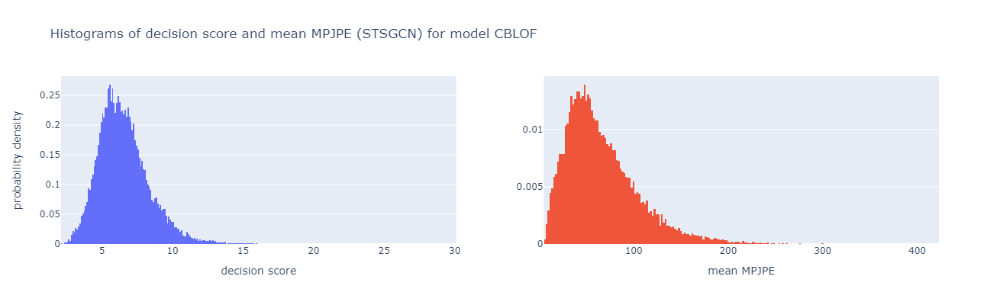

In [42]:
# 1 Histograms of decision score and mean MPJPE
# 2 Boxplot of mean MPJPE by outlier status
# 3 Histograms of mean MPJPE by outlier status
# 4 Scatter plot of mean MPJPE vs decision score by outlier status
# 5 Scatter plot of decision score vs start time of subsequence by outlier status
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status

# select plot by setting second argument to it, plot 5 and 6 require an action parameter

visualize_ood(df_subset_PCA_CBLOF, 1, "CBLOF", "STSGCN")

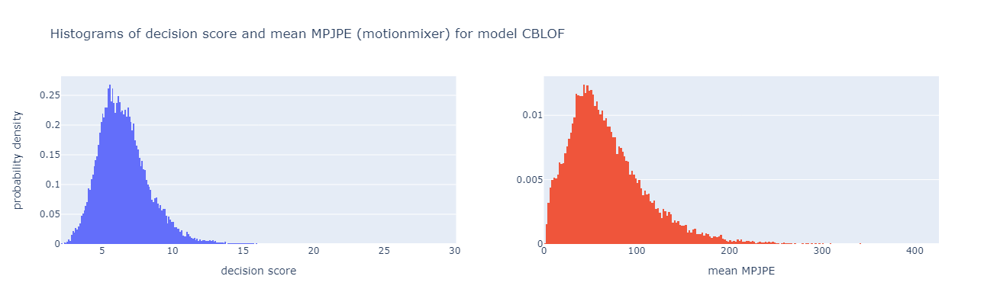

In [43]:
visualize_ood(df_subset_PCA_CBLOF, 1, "CBLOF", "motionmixer")

##### decision_function

In [ ]:
subset_CBLOF_model.decision_function(subset_CBLOF_scaling.transform(pca_model.transform(loader['waiting'].dataset.target[10].reshape(-1, 35*32*3))))

#### HDBSCAN

Notes on the features:
- Cluster labels: noise given the label -1,
- probabilities_: 0.0 ==> sample that is not in the cluster,
- outlier_scores_: The higher the score, the more likely the point is to be an outlier,


In [ ]:
df_subset_PCA_HDBSCAN, subset_HDBSCAN_model,_ = detect_OOD(df_subset_PCA, model = 'HDBSCAN',
                                                         scaling = True,
                                                         min_cluster_size=55  # True, 400 is the best on full dataset
                                                        )
df_subset_PCA_HDBSCAN.head()

In [ ]:
df_subset_PCA_HDBSCAN.groupby("outlier_HDBSCAN")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

In [ ]:
get_precision_recall(df_subset_PCA_HDBSCAN, error_threshold=0.75, ood_model_threshold=0.99, ood_model="HDBSCAN", motion_model="STSGCN")

In [ ]:
get_precision_recall(df_subset_PCA_HDBSCAN, error_threshold=0.75, ood_model_threshold=0.99, ood_model="HDBSCAN", motion_model="motionmixer")

In [ ]:
# 1 Histograms of decision score and mean MPJPE
# 2 Boxplot of mean MPJPE by outlier status
# 3 Histograms of mean MPJPE by outlier status
# 4 Scatter plot of mean MPJPE vs decision score by outlier status
# 5 Scatter plot of decision score vs start time of subsequence by outlier status
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status

# select plot by setting second argument to it, plot 5 and 6 require an action parameter

visualize_ood(df_subset_PCA_HDBSCAN, 2, "HDBSCAN", "STSGCN")

In [ ]:
visualize_ood(df_subset_PCA_HDBSCAN, 2, "HDBSCAN", "motionmixer")

#### IFOREST

- decision_scores, The outlier scores of the training data. The higher, the more abnormal. 
- Labels_ 0--> inlier, 1-->outlier


In [44]:
df_subset_PCA_IFOREST, subset_IFOREST_model = detect_OOD(df_subset_PCA,model = 'IFOREST',
                                                         scaling = False,
                                                         contamination=0.01,
                                                         n_estimators=100
                                                        )
df_subset_PCA_IFOREST.head()

,0,1,2,3,4,5,6,7,8,9,...,action,mean_mpjpe_STSGCN,mean_mpjpe_motionmixer,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms,outlier_IFOREST,decision_scores
0,-3111.106689,1813.413452,725.572693,138.857971,1177.943726,865.244080,-2178.981445,-624.509949,-794.360962,398.166962,...,walking,37.308055,35.490965,1,2,1412,56520.0,57880.0,0,-0.095427
1,-1639.078491,-2406.969238,-3773.555664,4473.478027,1947.492554,377.233429,-612.351257,-354.787628,146.250549,-218.550140,...,walking,44.560363,51.674447,9,1,928,37160.0,38520.0,0,-0.103764
2,-1037.800293,-1902.311768,-3683.295166,4847.373535,1462.718872,-308.194153,-379.046234,-58.404076,116.216103,-17.082371,...,walking,45.434795,52.276969,9,1,854,34200.0,35560.0,0,-0.095662
3,-1376.332153,-1675.917847,-714.824097,-3297.200439,1484.469360,-2262.552002,1629.458130,291.094147,-125.892609,268.413757,...,walking,32.930991,43.683820,9,1,1149,46000.0,47360.0,0,-0.103469
4,-2697.131592,-6318.559082,-791.093079,-851.374634,706.159485,229.302490,5.313560,-632.661621,-927.932556,384.666504,...,walking,49.074074,40.456684,6,1,70,2840.0,4200.0,0,-0.080458


In [45]:
df_subset_PCA_IFOREST.groupby("outlier_IFOREST")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

mean_mpjpe_STSGCN                                     
                            count        mean        std        min   
outlier_IFOREST                                                       
0                         29700.0   65.616765  37.638885   5.313938  \
1                           300.0  161.111310  54.676552  49.778442   

                                                                  
                        25%         50%         75%         max   
outlier_IFOREST                                                   
0                 38.389727   57.759910   85.133505  301.771918  \
1                123.731833  154.465028  189.545025  422.017375   

                mean_mpjpe_motionmixer                                     
                                 count        mean        std        min   
outlier_IFOREST                                                            
0                              29700.0   67.387321  40.984498   1.523802  \
1                                300.0  173.005170  62.778863  46.868738   

                                                                 
                        25%         50%         75%         max  
outlier_IFOREST                                                  
0                 38.212150   59.570368   88.670079  326.629375  
1                128.356958  163.904166  208.571317  425.759171

In [46]:
get_precision_recall(df_subset_PCA_IFOREST, error_threshold=0.75, ood_model_threshold=0.99, ood_model="IFOREST", motion_model="STSGCN")

recall = 0.038, precision = 0.943


In [47]:
get_precision_recall(df_subset_PCA_IFOREST, error_threshold=0.75, ood_model_threshold=0.99, ood_model="IFOREST", motion_model="motionmixer")

recall = 0.037, precision = 0.93


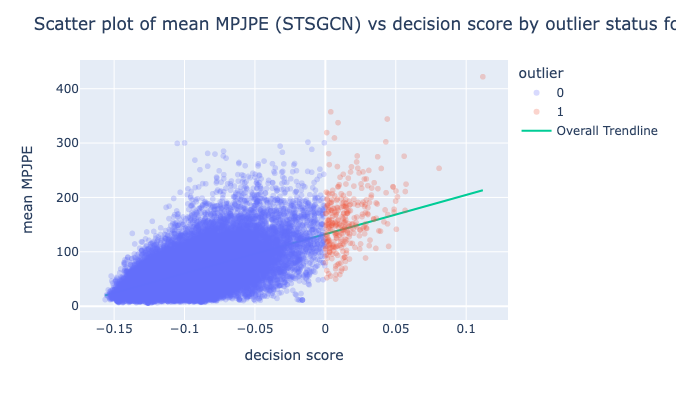

In [48]:
# 1 Histograms of decision score and mean MPJPE
# 2 Boxplot of mean MPJPE by outlier status
# 3 Histograms of mean MPJPE by outlier status
# 4 Scatter plot of mean MPJPE vs decision score by outlier status
# 5 Scatter plot of decision score vs start time of subsequence by outlier status
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status

# select plot by setting second argument to it, plot 5 and 6 require an action parameter

visualize_ood(df_subset_PCA_IFOREST, 4, "IFOREST", "STSGCN")

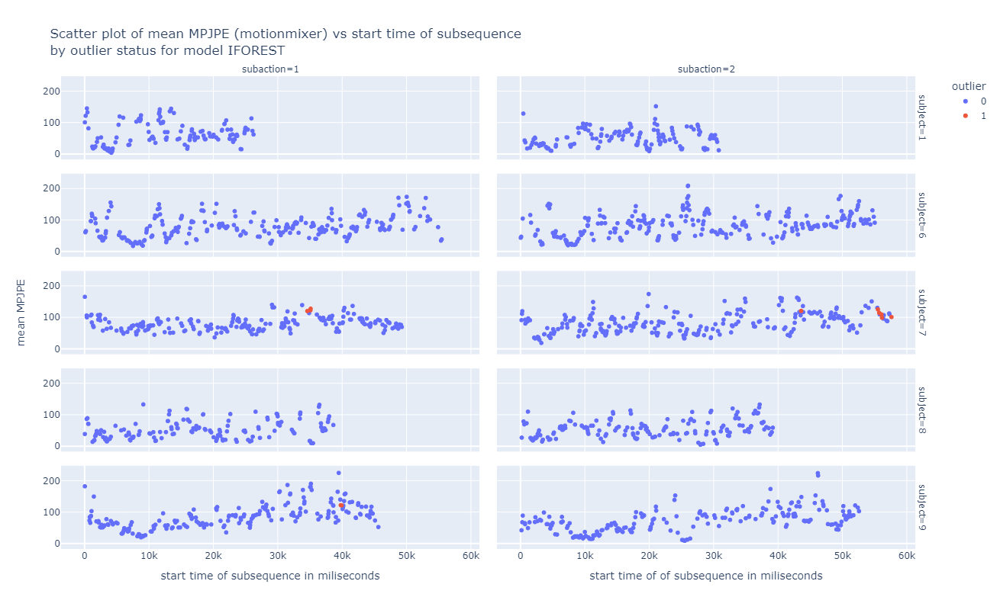

In [49]:
visualize_ood(df_subset_PCA_IFOREST, 6, "IFOREST", "motionmixer", action="directions")

#### LOF 

Notes:
- Decision_scores_: Outliers have higher scores
- n_neighbors: The number of neighbors for which the reference density is calculated. Should be relative to size of data.

From the documentation: 
The anomaly score of each sample is called Local Outlier Factor. It measures the local deviation of density of a given sample with respect to its neighbors. It is local in that the anomaly score depends on how isolated the object is with respect to the surrounding neighborhood. More precisely, locality is given by k-nearest neighbors, whose distance is used to estimate the local density. By comparing the local density of a sample to the local densities of its neighbors, one can identify samples that have a substantially lower density than their neighbors. These are considered outliers.

In [50]:
df_subset_PCA_LOF, subset_LOF_model,_ = detect_OOD(df_subset_PCA,
                                                 model = 'LOF',
                                                 scaling = True,
                                                 contamination=0.01,
                                                 n_neighbors=350, # works for the subset
                                                )
df_subset_PCA_LOF.head()

scaling is done



,0,1,2,3,4,5,6,7,8,9,...,action,mean_mpjpe_STSGCN,mean_mpjpe_motionmixer,subject,subaction,subseq_subject_subaction,min_time_ms,max_time_ms,outlier_LOF,decision_scores
0,-0.657370,0.494479,0.746775,1.060328,-0.459804,0.563963,0.482388,1.078697,0.327107,-0.980094,...,walking,37.308055,35.490965,1,2,1412,56520.0,57880.0,0,1.088590
1,-0.346334,-0.656328,-0.802011,-0.390966,0.718372,-0.666530,-1.202946,2.192561,0.482412,-2.684884,...,walking,44.560363,51.674447,9,1,928,37160.0,38520.0,0,1.144918
2,-0.219285,-0.518719,1.073606,0.182666,-0.676668,-0.857343,-0.277692,1.754263,-0.206141,0.685323,...,walking,45.434795,52.276969,9,1,854,34200.0,35560.0,0,1.087034
3,-0.290816,-0.456987,-0.938260,0.278953,0.097868,-0.371985,-1.255071,0.247382,-0.018543,-2.906292,...,walking,32.930991,43.683820,9,1,1149,46000.0,47360.0,0,1.123496
4,-0.569898,-1.722934,2.334205,-0.660489,-0.744622,-0.105941,0.958248,-0.394213,-0.070766,-0.940903,...,walking,49.074074,40.456684,6,1,70,2840.0,4200.0,0,1.110131


In [51]:
df_subset_PCA_LOF.groupby("outlier_LOF")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

mean_mpjpe_STSGCN                                                 
                        count        mean        std        min         25%   
outlier_LOF                                                                   
0                     29700.0   65.619846  37.655623   5.313938   38.389727  \
1                       300.0  160.806306  54.061951  68.615255  118.954591   

                                                mean_mpjpe_motionmixer   
                    50%         75%         max                  count   
outlier_LOF                                                              
0             57.748688   85.112184  357.471017                29700.0  \
1            154.986275  191.113204  422.017375                  300.0   

                                                                        
                   mean        std        min         25%         50%   
outlier_LOF                                                             
0             67.386584  40.944831   1.523802   38.212150   59.552532  \
1            173.078155  65.180619  70.285084  123.212247  164.295930   

                                     
                    75%         max  
outlier_LOF                          
0             88.679856  345.389624  
1            213.201563  425.759171

In [52]:
get_precision_recall(df_subset_PCA_LOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="LOF", motion_model="STSGCN")

recall = 0.038, precision = 0.953


In [53]:
get_precision_recall(df_subset_PCA_LOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="LOF", motion_model="motionmixer")

recall = 0.037, precision = 0.917


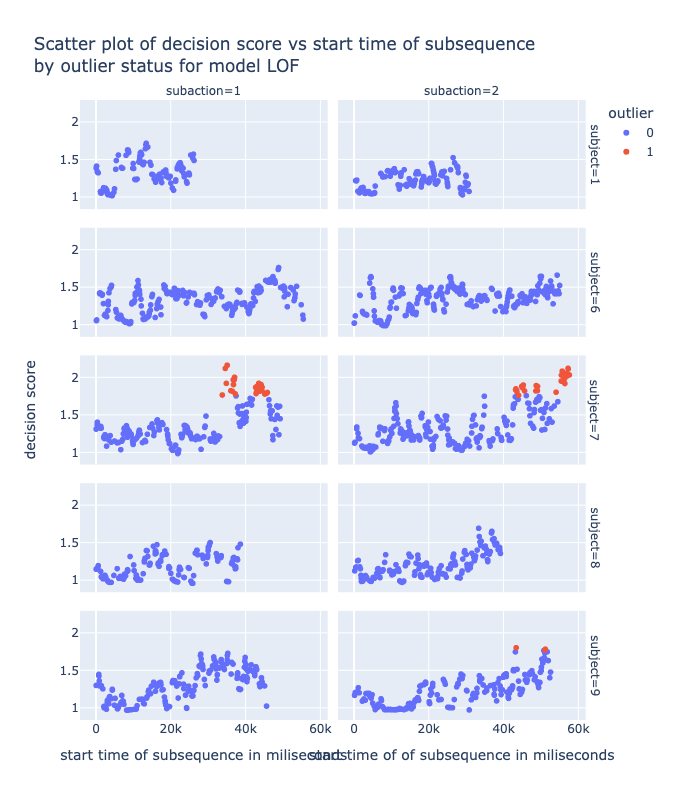

In [54]:
# 1 Histograms of decision score and mean MPJPE
# 2 Boxplot of mean MPJPE by outlier status
# 3 Histograms of mean MPJPE by outlier status
# 4 Scatter plot of mean MPJPE vs decision score by outlier status
# 5 Scatter plot of decision score vs start time of subsequence by outlier status
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status

# select plot by setting second argument to it, plot 5 and 6 require an action parameter

visualize_ood(df_subset_PCA_LOF, 5, "LOF", action="directions") # no error metric needed

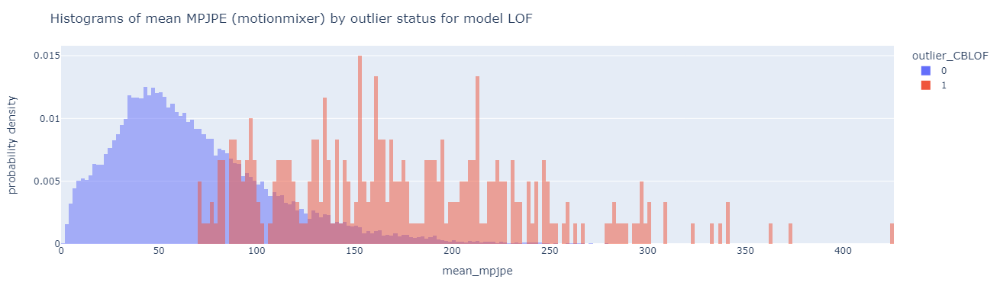

In [55]:
visualize_ood(df_subset_PCA_LOF, 3, "LOF", "motionmixer")

### Application -- Full dataframe 

In [ ]:
df_full_PCA,_ = project_PCA(df_full, n_components = 50)
df_full_PCA.head()

#### CBLOF

In [ ]:
df_full_PCA_CBLOF, CBLOF_model,_ = detect_OOD(df_full_PCA,model = 'CBLOF',
                                            scaling = True,
                                            contamination=0.01,
                                            alpha = 0.95, #0.98 with better for the subset
                                           )
df_full_PCA_CBLOF.head()

In [ ]:
df_full_PCA_CBLOF.groupby("outlier_CBLOF")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

In [ ]:
get_precision_recall(df_full_PCA_CBLOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="CBLOF", motion_model="STSGCN")

In [ ]:
get_precision_recall(df_full_PCA_CBLOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="CBLOF", motion_model="motionmixer")

In [ ]:
# I did not use visualize_ood here or below, because on the df_full_ ... this will likely be slow. 
# But one could sample if one wants to visualize using the subset function

#### HDBSCAN

In [ ]:
df_full_PCA_HDBSCAN, HDBSCAN_model,_ = detect_OOD(df_full_PCA, model = 'HDBSCAN',
                                                scaling = True,
                                                min_cluster_size=400  # 55 is the best on subset
                                               )
df_full_PCA_HDBSCAN.head()

In [ ]:
df_full_PCA_HDBSCAN.groupby("outlier_HDBSCAN")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

In [ ]:
get_precision_recall(df_full_PCA_HDBSCAN, error_threshold=0.75, ood_model_threshold=0.99, ood_model="HDBSCAN", motion_model="STSGCN")

In [ ]:
get_precision_recall(df_full_PCA_HDBSCAN, error_threshold=0.75, ood_model_threshold=0.99, ood_model="HDBSCAN", motion_model="motionmixer")

#### IFOREST

In [ ]:
df_full_PCA_IFOREST, IFOREST_model,_ = detect_OOD(df_full_PCA,model = 'IFOREST',
                                                scaling = True,
                                                contamination=0.01,
                                                n_estimators=100
                                               )
df_full_PCA_IFOREST.head()

In [ ]:
df_full_PCA_IFOREST.groupby("outlier_IFOREST")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

In [ ]:
get_precision_recall(df_full_PCA_IFOREST, error_threshold=0.75, ood_model_threshold=0.99, ood_model="IFOREST", motion_model="STSGCN")

In [ ]:
get_precision_recall(df_full_PCA_IFOREST, error_threshold=0.75, ood_model_threshold=0.99, ood_model="IFOREST", motion_model="motionmixer")

#### LOF

In [ ]:
df_full_PCA_LOF, LOF_model,_ = detect_OOD(df_full_PCA, model = 'LOF',
                                        scaling = True,
                                        contamination=0.01,
                                        n_neighbors=1500 # have not tested and maybe can further improve, 300 as for subset is of course too low
                                        )
df_full_PCA_LOF.head()

In [ ]:
df_full_PCA_LOF.groupby("outlier_LOF")[["mean_mpjpe_STSGCN", "mean_mpjpe_motionmixer"]].describe()

In [ ]:
get_precision_recall(df_full_PCA_LOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="LOF", motion_model="STSGCN")

In [ ]:
get_precision_recall(df_full_PCA_LOF, error_threshold=0.75, ood_model_threshold=0.99, ood_model="LOF", motion_model="motionmixer")

## Train ALL models at once and get the metrics 

### Needed functions 

In [ ]:
# This function take the original dataframe with the joints position and train 4 OOD models (it applies PCA and Scaling too) in 3 modes (35 frames, 10 inpute frames, 25 outputframes), 
#It returns a new dataframe with the 4 decision scores and the pipeline to use it on new sample. 


def create_metrics_df(df,n_frames_fn,  PCA_fn, scaling_fn,  detect_OOD_fn, random_state=42):
    
    models_scores = {'CBLOF':'decision_scores',
                     'IFOREST':'decision_scores',
                     'HDBSCAN': 'outlier_scores_',
                     'LOF':'decision_scores'
                     }    
    modes = {'full': (0,34), 'Ti_10':(0,9), 'To_25':(10,34)} #(a,b): a= start frame, b = end_frame
    
    columns_to_include = ['idx','action']+ [column for column in df.columns.astype(str) if column.startswith('mean_mpjpe')]
    #columns_to_include = [col for col in df.columns.astype(str) if not re.match(r'^\d+', col)]
    metrics_df = df.copy(deep = True)[columns_to_include].reset_index(drop=True)
    
    pipeline = []
    
    for mode in modes.keys():
        mode_list = []
        df_ = df.copy(deep = True)
        a,b = modes[mode]
        df_ = n_frames_fn(df_ ,a,b) 
        df_, pca_model = PCA_fn(df_, n_components = 50)
        mode_list.append(pca_model)
        df_, scaling_model = scaling_fn (df_, random_state=random_state)
        mode_list.append(scaling_model)
        models_list = []
        for model in models_scores.keys():
            df_m = df_.copy(deep = True)
            print(f"Applying {model} on {mode}...")
            df_m,OOD_model = detect_OOD_fn(df_, model = model, scaling = False, random_state=random_state)
            df_m = df_m[['idx','action', models_scores[model]]]
            metrics_df = metrics_df.merge(df_m, how='inner', on=['idx','action'])\
                        .rename(columns = {models_scores[model]:f"{model}_{mode}"})
            models_list.append(OOD_model)
            print('done!')
        mode_list.append(models_list)
        pipeline.append(mode_list)
        
    return metrics_df, pipeline

#### test on a small subset 

In [ ]:
test1,pipeline = create_metrics_df(create_df_subset(df_full, n =50), n_frames, project_PCA,scaling_fn, detect_OOD)
test1
#notethat when you are running on a small samble some of the choosen parameters for the model won't be optimal  

In [ ]:
pipeline

### Application on full data (can take some time)

In [ ]:
metrics_df, pipeline = create_metrics_df(df_full, n_frames, project_PCA,scaling_fn, detect_OOD)
metrics_df

In [ ]:
pipeline

In [ ]:
metrics_df.to_csv('metrics.csv')   # save it so you dont need to generate it everytime you want to use the Analysis Toolkit below

# Run model/s on a sample from the Loader to get the decision scores

**NEEDS DOUBLE CHECK**

This section is not complete yet. The following needs to be fixed:
- Extract the decision scores from HDBSCAN for new data sample.
- The feature names are not the same which raising a warning msg. 

## Needed function 

In [ ]:
def decision_fn(pipeline, mode, sample):
    
    modes_dic = {'full':0, 'Ti_10':1, 'To_25':2} 
    pipeline_full = pipeline[modes_dic[mode]]
    sample = pd.DataFrame(sample.reshape(-1, 35*32*3))
    if mode == 'Ti_10':
        sample = n_frames(sample, 0, 9)
    if mode == 'To_25':
        sample = n_frames(sample, 10, 34)
    sample_pca_sc = pipeline_full[1].transform(pipeline_full[0].transform(sample))
    model_dic = {'CBLOF': 0, 'IForest':1, 'HDBSCAN':2, 'LOF':3}
    CBLOF_decision_score = pipeline_full[2][model_dic['CBLOF']].decision_function(sample_pca_sc)
    IForest_decision_score = pipeline_full[2][model_dic['IForest']].decision_function(sample_pca_sc)
   # test_labels, strengths = hdbscan.approximate_predict(pipeline_full[2][model_dic['HDBSCAN']], sample_pca_sc)
   # hdbscan_score = [test_labels, strengths]
    LOF_decision_score = pipeline_full[2][model_dic['LOF']].decision_function(sample_pca_sc)
    
    return CBLOF_decision_score, IForest_decision_score,  LOF_decision_score 

### test on a sample 

In [ ]:
#If you didnt already train the models via create_metrics_df uncomment the function below and test it on a sample 
#df_subset = create_df_subset(df_full, n =300)
#test1,pipeline = create_metrics_df(df_subset, n_frames, project_PCA,scaling_fn, detect_OOD)

In [ ]:
test1

In [ ]:
sample = loader['walking'].dataset.target[3116]

In [ ]:
CBLOF, IFOREST, LOF = decision_fn(pipeline, 'full', sample)
CBLOF, IFOREST, LOF

In [ ]:
CBLOF, IFOREST, LOF = decision_fn(pipeline, 'Ti_10', sample)
CBLOF, IFOREST, LOF

In [ ]:
CBLOF, IFOREST, LOF = decision_fn(pipeline, 'To_25', sample)
CBLOF, IFOREST, LOF

# Analysis ToolKit

## Simple Analysis and Visuals

### 2D Visualization -- T-SNE

#### Needed functions

In [ ]:
#This function project the 32*3 joint positions into 2D-space for visualisation 
def tsne_fn(df, action = None,
             perplexity=50, n_iter=1000, random_state =42  # TSNE hyperparameters  
            ):
    df_ = df.copy(deep = True)
    '''
    action: list or none
    '''
    df_.columns = df_.columns.astype(str)
    columns_to_drop = [col for col in df_.columns if not re.match(r'^\d+', col)]
    
    if action:
        df_= df_ [df_ .action.isin(action)]     
    tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=n_iter, random_state=random_state)
    df_ =pd.concat([
            pd.DataFrame(tsne.fit_transform(df_.drop(columns=columns_to_drop))),
            df_.loc[:,columns_to_drop]
                    ], axis=1)
    return df_ 

In [ ]:
# This function creates scatter plot. it can take the df as the output from the training of a single model (the output of detect_OOD)
#or df could be the output from create_metrics_df
#each of the above dataframes need to merge with the tsne projection before plotting


pd.set_option("plotting.backend", "plotly")

def create_plotly_OOD_tsne(df,model, colors_column_name = 'action', outlier_column_name= 'outlier_CBLOF', error_column_name = 'mean_mpjpe_STSGCN'):
    df_ = df.copy(deep = True)
    fig4 = go.Figure()
    for i in df_[colors_column_name].unique():
        ds_aux = df_[df_[colors_column_name]==i]
        fig4.add_traces(
        go.Scatter(
                x=ds_aux.iloc[:,0], y=ds_aux.iloc[:,1],
                mode="markers",
                name=str(i),
                marker={"size": (ds_aux[error_column_name]#/ds_aux['mean_mpjpe'].max())**2
                        ),
                        "sizeref": (ds_aux[error_column_name].max())**2/9000,
                        "sizemode": "area",'symbol':ds_aux[outlier_column_name] },
                 #symbol #"sizeref": ds_aux['mean_mpjpe'].max()/40
                #"size": ds_aux['outlier_CBLOF']+0.1,"sizeref": 1/90,  "sizemode": "area" 
                text = ds_aux['idx'],
                hovertemplate="<b> idx: %{text}</b><br><br>" 
               #+"text: %{y:$,.0f}<br>" +
               #"text: %{x:.1f}<br>" +
               +"outlier: %{marker.symbol:,}<br>"
            +"MPJPE (normalized): %{marker.size:.1f}<br>"
               #f"{colors_column_name}: {i}" 
            #f"<extra>{ds_aux[ds_aux['idx']==%{text:,}]['action'].values}</extra>", #[ds_aux['idx']==text]
                )
        )
        
    #fig4.update_yaxes(type="log")
    fig4.update_layout(
        title={"text": f"OOD detection via  {model}", "font": {"size": 24}},
        xaxis={"title": {"text": "Proj. 1", "font": {"size": 16}}},
        yaxis={"title": {"text": "Proj. 2", "font": {"size": 16}}},
    )
    fig4.update_layout(   #autosize=True
    height=600,
    width = 800
    )
    fig4.show()

#### Application using the output from detect_OOD -- subset dataframe

######  CBLOF 

In [ ]:
df_subset_PCA_CBLOF_TSNE = tsne_fn(df_subset_PCA_CBLOF) 
df_subset_PCA_CBLOF_TSNE

In [ ]:
create_plotly_OOD_tsne(create_df_subset(df_subset_PCA_CBLOF_TSNE, n = 300), model= 'CBLOF',\
                       colors_column_name = 'action', outlier_column_name= 'outlier_CBLOF')

###### HDBSCAN

In [ ]:
df_subset_PCA_HDBSCAN.head()

In [ ]:
df_subset_PCA_HDBSCAN_TSNE = tsne_fn(df_subset_PCA_HDBSCAN)
df_subset_PCA_HDBSCAN_TSNE

In [ ]:
create_plotly_OOD_tsne(create_df_subset(df_subset_PCA_HDBSCAN_TSNE, n = 300), model= 'HDBSCAN',\
                       colors_column_name = 'action', outlier_column_name= 'outlier_HDBSCAN')

Notes: The above shows more than 1% of the Noise 

In [ ]:
create_plotly_OOD_tsne(create_df_subset(df_subset_PCA_HDBSCAN_TSNE), model= 'HDBSCAN',\
                       colors_column_name = 'outlier_HDBSCAN', outlier_column_name= 'outlier_HDBSCAN')

###### IFOREST

In [ ]:
df_subset_PCA_IFOREST.head()

In [ ]:
df_subset_PCA_IFOREST_TSNE = tsne_fn(df_subset_PCA_IFOREST)
df_subset_PCA_IFOREST_TSNE

In [ ]:
create_plotly_OOD_tsne(create_df_subset(df_subset_PCA_IFOREST_TSNE, n = 300), model= 'IFOREST',\
                       colors_column_name = 'action', outlier_column_name= 'outlier_IFOREST')

In [ ]:
create_plotly_OOD_tsne(create_df_subset(df_subset_PCA_IFOREST_TSNE), model= 'IFOREST',\
                       colors_column_name = 'outlier_IFOREST', outlier_column_name= 'outlier_IFOREST')

#### Application using the output from create_metrics_df - All decision scores from all the models

We will apply only the tsne projection here, then we refer to the presentation.ipynb to generate the scatter plot. 

In [ ]:
df_tsne = tsne_fn(project_PCA(df_full)[0])
df_tsne

In [ ]:
df_tsne.to_csv('df_tsne.csv')
#save it to merge it with the dataframes with all the decision scores  (the output of create_metrics_df)
#and use it in the presentation notebook and to create the two interactive apps 

## Generate dataframes with analysis using different thresholds

Use The average MPJP error from different motion models to understand the performance of the OOD models.

- To run this part you dont need the train the models we saved the output on a csv file and we will read it

### Needed functions

In [ ]:
def create_fast_analysis(mdf,model_threshold, error_threshold,
                         motion_models = ['STSGCN', 'motionmixer'],\
                         models = ['CBLOF','IFOREST','HDBSCAN', 'LOF'],\
                         modes = ['full', 'Ti_10', 'To_25']):
    
    mdf_ = mdf.copy(deep = True)
    
    outliers_number = mdf_[(mdf_[f"mean_mpjpe_{motion_models[0]}"] >=mdf_[f"mean_mpjpe_{motion_models[0]}"].quantile(error_threshold))].shape[0]
          
    df_ = pd.DataFrame(columns=[f'motion_model_th:{error_threshold}',f'OOD_model_th:{model_threshold}',\
                                'mode','recall', 'precision'])
    row_idx =0
    list_recall_and = []
    list_prec_and  =[]
    list_recall_or = []
    list_prec_or  =[]
    for motion_model in motion_models:
        for mode in modes:
            for model in models:
                True_positive_number = mdf_[(mdf_[f"{model}_{mode}"] >= mdf_[f"{model}_{mode}"].quantile(model_threshold)) & (mdf_[f"mean_mpjpe_{motion_model}"] >= mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold))].shape[0]
                False_positive_number = mdf_[(mdf_[f"{model}_{mode}"] >= mdf_[f"{model}_{mode}"].quantile(model_threshold)) & (mdf_[f"mean_mpjpe_{motion_model}"] < mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold))].shape[0]
                df_.loc[row_idx] = [motion_model, model, mode,True_positive_number/outliers_number, True_positive_number/(False_positive_number+True_positive_number)]
                row_idx +=1
            
            for i in range(0, len(models)):
                if i == 0:
                    filter_pred_outliers_and = (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))
                    filter_pred_outliers_or = (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))
                else:
                    filter_pred_outliers_and = (filter_pred_outliers_and) & (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))    
                    filter_pred_outliers_or = (filter_pred_outliers_or) | (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))    

            TP_and = mdf_[(filter_pred_outliers_and)& (mdf_[f"mean_mpjpe_{motion_model}"] >= mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold))].shape[0]
            FP_and =mdf_[(filter_pred_outliers_and) & (~(mdf_[f"mean_mpjpe_{motion_model}"] >= mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold)))] .shape[0]
            try: 
                recall_and = TP_and/outliers_number
            except:
                recall_and = 'not available ~ infinity'
            try: 
                precision_and = TP_and / (TP_and + FP_and)
            except:
                 precision_and = 'not available ~ infinity'
       
            TP_or = mdf_[filter_pred_outliers_or & (mdf_[f"mean_mpjpe_{motion_model}"] >= mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold))] .shape[0]
            FP_or =mdf_[filter_pred_outliers_or & (~(mdf_[f"mean_mpjpe_{motion_model}"] >= mdf_[f"mean_mpjpe_{motion_model}"].quantile(error_threshold)))] .shape[0]
            
            try: 
                recall_or = TP_or/outliers_number
            except:
                recall_or = 'not available ~ infinity'
            try:   
                precision_or = TP_or / (TP_or + FP_or)
            except:
                precision_or = 'not available ~ infinity'
                
    
            list_recall_and  = list_recall_and +[recall_and]+['~']*(len(models)-1) 
            list_prec_and = list_prec_and +[precision_and]+['~']*(len(models)-1) 
            list_recall_or  = list_recall_or + [recall_or]+['~']*(len(models)-1) 
            list_prec_or = list_prec_or + [precision_or]+['~']*(len(models)-1) 
                
    df_['recall_&']  = list_recall_and
    df_['precision_&'] = list_prec_and
    df_['recall_or']  = list_recall_or
    df_['precision_or'] = list_prec_or 
    return df_               

In [ ]:
def general_analysis(mdf,model_threshold, error_threshold,
                    motion_models = ['STSGCN', 'motionmixer'],
                    modes = ['full', 'Ti_10', 'To_25'],
                    models = ['CBLOF','IFOREST','HDBSCAN','LOF']):
    
    mdf_ = mdf.copy(deep = True)

# Below we define a sequence as an outlier if it's mpjpe_error pass the error_threshold for ALL the motion_models
    for i in range(0, len(motion_models)):
        if i == 0:
            filter_outliers = (mdf_[f'mean_mpjpe_{motion_models[i]}'] >=mdf_[f'mean_mpjpe_{motion_models[i]}'].quantile(error_threshold)) 
        else:
            filter_outliers = (filter_outliers) & (mdf_[f'mean_mpjpe_{motion_models[i]}'] >=mdf_[f'mean_mpjpe_{motion_models[i]}'].quantile(error_threshold)) 
    outliers_number = mdf_[filter_outliers].shape[0]
    
    df_ = pd.DataFrame(columns=[f"modes_mt={model_threshold}_et={error_threshold}", "recall_&", "precision_&", "recall_or", "precision_or"])
    
    row_idx =0
    for mode in modes:
        for i in range(0, len(models)):
            if i == 0:
                filter_pred_outliers_and = (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))
                filter_pred_outliers_or = (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))
            else:
                filter_pred_outliers_and = (filter_pred_outliers_and) & (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))    
                filter_pred_outliers_or = (filter_pred_outliers_or) | (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))    

        TP_and = mdf_[(filter_pred_outliers_and)& (filter_outliers)].shape[0]
        FP_and =mdf_[(filter_pred_outliers_and) & (~(filter_outliers))] .shape[0]
        try:
            recall_and = TP_and/outliers_number
        except:
            recall_and = 'not available ~ infinity'
        try:
            precision_and = TP_and / (TP_and + FP_and)
        except:
            precision_and = 'not available ~ infinity'
       
        TP_or = mdf_[filter_pred_outliers_or & (filter_outliers)] .shape[0]
        FP_or =mdf_[filter_pred_outliers_or & (~(filter_outliers))] .shape[0]
        
        try:
            recall_or = TP_or/outliers_number
        except:
            recall_or = 'not available ~ infinity'
        try:
            precision_or = TP_or / (TP_or + FP_or)
        except:
            precision_or =  'not available ~ infinity'
            
                
        df_.loc[row_idx] = [mode, recall_and, precision_and, recall_or, precision_or]
        row_idx +=1
    
    return df_

In [ ]:
def get_index(mdf,model_threshold, error_threshold, operator = 'and',
                    motion_models = ['STSGCN', 'motionmixer'],
                    mode = 'full',
                    models = ['CBLOF','IFOREST','HDBSCAN', 'LOF']):
    '''
    operator: 'and' / 'or' applied if the len(models)>1
    mode: 'full' or  'Ti_10' or 'To_25'
    '''
    mdf_ = mdf.copy(deep = True)

    #1. we define outliers for the motion_model/s based on error_threshold
    if len(motion_models) != 0:
        for i in range(0, len(motion_models)):
            if i == 0:
                filter_outliers = (mdf_[f'mean_mpjpe_{motion_models[i]}'] >=mdf_[f'mean_mpjpe_{motion_models[i]}'].quantile(error_threshold)) 
            else:
                filter_outliers = (filter_outliers) & (mdf_[f'mean_mpjpe_{motion_models[i]}'] >=mdf_[f'mean_mpjpe_{motion_models[i]}'].quantile(error_threshold)) 
        print('total number of ground truth outliers:', mdf_[filter_outliers].shape[0])
        if len(models) == 0:
            print('Here is the dataframe of the True outliers')
            return mdf_[filter_outliers]
        
    #2. we define predicted outliers for the OOD model/s based on model_threshold
    if len(models) != 0:
        for i in range(0, len(models)):
            if i == 0:
                filter_pred_outliers = (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))
            else:
                if operator == 'and':
                    filter_pred_outliers = (filter_pred_outliers) & (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))    
                if operator == 'or':
                    filter_pred_outliers = (filter_pred_outliers) | (mdf_[f"{models[i]}_{mode}"]>=mdf_[f"{models[i]}_{mode}"].quantile(model_threshold))  
        print('total number of predicted outliers:', mdf_[filter_pred_outliers].shape[0])
        if len(motion_models) == 0:
            print('Here is the dataframe of the predicted outliers')
            return mdf_[filter_pred_outliers]
        else:
            print('Total number of True positive predicted outliers:' , mdf_[(filter_pred_outliers)&(filter_outliers)].shape[0] )
            print('Here is the dataframe of True positive predicted outliers')
            return mdf_[(filter_pred_outliers)&(filter_outliers)]

#### test on a small subset for quick illustration

In [ ]:
test1,pipeline = create_metrics_df(create_df_subset(df_full, n =20), n_frames, project_PCA,scaling_fn, detect_OOD)

In [ ]:
test2 = create_fast_analysis(test1,0.90,0.97)
test2

In [ ]:
test3 = general_analysis(test1,0.90,0.97)
test3

In [ ]:
test1

In [ ]:
test4 = get_index(test1,0.90,0.50,motion_models = ['STSGCN', 'motionmixer'], models = ['LOF'])
test4

### Application on full data

In [ ]:
#metrics_df,_ = create_metrics_df(df_full, n_frames, project_PCA, detect_OOD)

In [ ]:
metrics_df = pd.read_csv('metrics.csv').drop(columns= ['Unnamed: 0']) #Run thin cell if you didnt already generated metrics_df
metrics_df

In [ ]:
create_fast_analysis(metrics_df,0.90,0.97)

In [ ]:
general_analysis(metrics_df,0.90,0.97)

In [ ]:
SMCf_90_97 = get_index(metrics_df, 0.94, 0.90, motion_models = ['STSGCN', 'motionmixer'], models = ['CBLOF'], mode = 'full')
SMCf_90_97

## Generate two interactive apps

Here we only generate the dataframe needed to run the following two notebooks from the repository that generate the two interactive apps.

* notebooks/outlier_detection_app_1.ipynb 
* notebooks/outlier_detection_app_2.ipynb

In [ ]:
##Run thin cell if you didnt already generated metrics_df
#metrics_df = pd.read_csv('metrics.csv').drop(columns= ['Unnamed: 0']) 

##Run thin cell if you didnt already generated df_tsne
#df_tsne = pd.read_csv('df_tsne.csv').drop(columns= ['Unnamed: 0'])


In [ ]:
tsne_metrics = df_tsne.loc[:,['0','1']+['idx','action']].merge(metrics_df,\
                   how='inner', on=['idx','action'])
tsne_metrics['min_mean_mpjpe'] = tsne_metrics[['mean_mpjpe_STSGCN','mean_mpjpe_motionmixer']].min(axis=1)

In [ ]:
tsne_metrics

In [ ]:
#tsne_metrics.to_csv('tsne_metrics.csv') #save it and use it to Run the two notebooks for the apps 

## Kinematics analysis

In [ ]:
#SMCf_90_97 = get_index(metrics_df, 0.94, 0.90, motion_models = ['STSGCN', 'motionmixer'], models = [], mode = 'full')
#SMCf_90_97

In [ ]:
outlier_df= pd.read_csv('outliers_mt0.90_et0.97.csv').drop(columns= ['Unnamed: 0'])
outlier_df

### Differ between inliers and outliers

#### Define functions

##### Calculate velocity and acceleration in spherical coordinate system differing between inliers and outliers

Note. We must generate the loaderDict in spherical coordinates from earlier section. 

In [ ]:
def differ_inliers(loaderDict, actions = actions, outlier_df = outlier_df):

    inlier_dict = {}
    outlier_dict = {}
    
    for action in actions:
        outlier_list = list(outlier_df[(outlier_df.predicted_outliers == 1) & (outlier_df.action == action)].idx)
        inlier_list = list(outlier_df[(outlier_df.predicted_outliers == 0) & (outlier_df.action == action)].idx)
        
        loader_item = loaderDict[action]
        inliers = loader_item[inlier_list]                # this must be changed so that the indices are not lost (see boolean mask / chatGPT)
        outliers = loader_item[outlier_list]              # this must be changed so that the indices are not lost
        
        inlier_dict[action] = inliers
        outlier_dict[action] = outliers
    
    inlier_loader_item = np.vstack(list(inlier_dict.values()))
    outlier_loader_item = np.vstack(list(outlier_dict.values()))
        
    return inlier_dict, outlier_dict, inlier_loader_item, outlier_loader_item

def analyze_inoutliers(inlier_dict, outlier_dict):
    velocities_dict_inliers = {}
    velocities_dict_outliers = {}
    accelerations_dict_inliers = {}
    accelerations_dict_outliers = {}
    
    for action in inlier_dict.keys():
        # calculate velocities for inliers and outliers
        v_r_cube_in, v_theta_cube_in, v_phi_cube_in = calculate_spherical_velocity(inlier_dict[action])
        v_r_cube_out, v_theta_cube_out, v_phi_cube_out = calculate_spherical_velocity(outlier_dict[action])
        velocities_dict_inliers[action] = [v_r_cube_in, v_theta_cube_in, v_phi_cube_in]
        velocities_dict_outliers[action] = [v_r_cube_out, v_theta_cube_out, v_phi_cube_out]
    
        # calculate accelerations for inliers and outliers
        a_r_cube_in, a_theta_cube_in, a_phi_cube_in = calculate_spherical_acceleration(inlier_dict[action])
        a_r_cube_out, a_theta_cube_out, a_phi_cube_out = calculate_spherical_acceleration(outlier_dict[action])
        accelerations_dict_inliers[action] = [a_r_cube_in, v_theta_cube_in, a_phi_cube_in]
        accelerations_dict_outliers[action] = [a_r_cube_out, a_theta_cube_out, a_phi_cube_out]
        print(f"kinematics for {action} calculated")
    
    return velocities_dict_inliers, velocities_dict_outliers, accelerations_dict_inliers, accelerations_dict_outliers

#### Apply functions

In [ ]:
inlier_dict, outlier_dict, inlier_loader_item, outlier_loader_item = differ_inliers(loaderDict, actions, outlier_df)
velocities_dict_inliers, velocities_dict_outliers, acceleration_dict_inliers, acceleration_dict_outliers = analyze_inoutliers(inlier_dict, outlier_dict)

velocity_inlier_walking_average = kinematics_average(velocities_dict_inliers, ["walking"])
velocity_outlier_walking_average = kinematics_average(velocities_dict_outliers, ["walking"])

acceleration_inlier_walking_average = kinematics_average(acceleration_dict_inliers, ["walking"])
acceleration_outlier_walking_average = kinematics_average(acceleration_dict_outliers, ["walking"])

### Visualizing (lists of) subsequences using velocity/acceleration (spherical coordinates)

#### define functions

* requires calculate_spherical_velocity and calculate_spherical_acceleration from above

In [ ]:
def plot_spherical_velocity(loaderDict, actions = ["walking"], sequence = None, average = False, inlier_list = None, average_all = False, highlighters = False):

    for action in actions: 
        if inlier_list != None:
            loader_item = loaderDict[action][inlier_list]
        elif average_all == True:
            loaders_list = []
            for action in actions:
                loader_item_for_list = loaderDict[action]
                loaders_list.append(loader_item_for_list)
            loader_item = np.concatenate(loaders_list, axis = 0)
        else: 
            loader_item = loaderDict[action][:sequence]
        
        v_r_cube, v_theta_cube, v_phi_cube = calculate_spherical_velocity(loader_item)
        
        if average:
            v_r, v_theta, v_phi = pd.DataFrame(np.mean(v_r_cube, axis = 0)), pd.DataFrame(np.mean(v_theta_cube, axis = 0)), pd.DataFrame(np.mean(v_phi_cube, axis = 0))
        else:    
            v_r, v_theta, v_phi = pd.DataFrame(v_r_cube[-1]), pd.DataFrame(v_theta_cube[-1]), pd.DataFrame(v_phi_cube[-1])

        # initialize graph
        fig_vspherical = make_subplots(rows=3, cols=1, subplot_titles=("Radial velocity / moving towards body", "Inclination velocity / moving up or down", "Azimuth velocity / moving left or right"), shared_xaxes=True)

        # Make subplots
        fig_vr = go.Figure()
        fig_vphi = go.Figure()
        fig_vtheta = go.Figure()

        # select rows / joints to plot
        plot_columns = [3,8,19,27]
        colors = ["#ae0001", "#2a623d", "#222f5b", "#ecb939"]

        row_j = 0

        for column_i in plot_columns:

                ### plot 1

            # Add traces to first plot
            fig_vspherical.add_trace(go.Scatter(y = v_r.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "1"),
                                     row = 1, col = 1)
            if highlighters:
                # add highlighters to first plot
                for row_j in range(v_r.shape[0]):
                    if abs(v_r.iloc[row_j,column_i]) > 250:
                        fig_vspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 1, col = 1)

            fig_vspherical.add_vline(x=10, row = 1, col = 1, line_color = "orange", line_dash="dash")

                ### plot 2

            # add traces to second plot
            fig_vspherical.add_trace(go.Scatter(y = v_theta.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "3"),
                                     row = 2, col = 1)
            if highlighters: 
            # add highlighters to second plot / inclination
                for row_j in range(v_theta.shape[0]):
                    if abs(v_theta.iloc[row_j,column_i]) > 1.5:
                    # print(f"{H36M_NAMES[column_i]} is moved inclinationally in frame {row_j}")
                        fig_vspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 2, col = 1)

            fig_vspherical.add_vline(x=10, row = 2, col = 1, line_color = "orange", line_dash="dash")

                ### plot 3

            # add traces to third plot / azimuth
            fig_vspherical.add_trace(go.Scatter(y = v_phi.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "2"),
                                     row = 3, col = 1)
            
            if highlighters:
                # add highlighters to third plot / azimuth
                for row_j in range(v_phi.shape[0]):
                    if abs(v_phi.iloc[row_j,column_i]) > 1:
                    # print(f"{H36M_NAMES[column_i]} is moved azimuthally in frame {row_j}")
                        fig_vspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 3, col = 1)

            fig_vspherical.add_vline(x=10, row = 3, col = 1, line_color = "orange", line_dash="dash")

        # Update layout and axis properties
        title = f"Spherical Velocities of selected joints for {action}"
        
        if average:
            title_text = f"Average of spherical velocities over all sequences of selected joints for '{action}'"
        elif average_all:
            title_text = f"Average of spherical velocities over all sequences and actions of selected joints"
        else: 
            title_text = f"Spherical velocities of selected joints for '{action}' starting from frame {sequence}"
        
        fig_vspherical.update_layout(height=800, width=800,
                                   title_text= title_text,
                                   legend_tracegroupgap=160)
        fig_vspherical.update_xaxes(title_text="Frame No", row=3, col=1)

        fig_vspherical.update_yaxes(title_text="[mm/s]", row=1, col=1)
        fig_vspherical.update_yaxes(title_text="[rad/s]", row=2, col=1)
        fig_vspherical.update_yaxes(title_text="[rad/s]", row=3, col=1)

        fig_vspherical.show()
        if average_all:
            break
    
def plot_spherical_acceleration(loaderDict, actions = ["walking"], sequence = None, average = False, average_all = False, inlier_list = None, highlighters = False):
    for action in actions:
        if inlier_list != None:
            loader_item = loaderDict[action][inlier_list]
        elif average_all == True:
            loaders_list = []
            for action in actions:
                loader_item_for_list = loaderDict[action]
                loaders_list.append(loader_item_for_list)
            loader_item = np.concatenate(loaders_list, axis = 0)
        else: 
            loader_item = loaderDict[action][:sequence]
        
        a_r_cube, a_theta_cube, a_phi_cube = calculate_spherical_acceleration(loader_item)
        
        if average:
            a_r, a_theta, a_phi = pd.DataFrame(np.mean(a_r_cube, axis = 0)), pd.DataFrame(np.mean(a_theta_cube, axis = 0)), pd.DataFrame(np.mean(a_phi_cube, axis = 0))
        else:    
            a_r, a_theta, a_phi = pd.DataFrame(a_r_cube[-1]), pd.DataFrame(a_theta_cube[-1]), pd.DataFrame(a_phi_cube[-1])

        # initialize graph 
        fig_aspherical = make_subplots(rows=3, cols=1, subplot_titles=("Radial acceleration / accelerating towards/from body", "Inclination acceleration / accelerating up or down", "Azimuth acceleration / accelerating left or right"), shared_xaxes=True)

        # Make subplots
        fig_ar = go.Figure()
        fig_aphi = go.Figure()
        fig_atheta = go.Figure()

        # select rows / joints to plot
        plot_columns = [3,8,19,27]
        colors = ["#ae0001", "#2a623d", "#222f5b", "#ecb939"]

        row_j = 0

        for column_i in plot_columns:
            # Add traces to first plot
            fig_aspherical.add_trace(go.Scatter(y = a_r.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "1"),
                                     row = 1, col = 1)
            if highlighters: 
                # add highlighters to first plot
                for row_j in range(a_r.shape[0]):
                    if abs(a_r.iloc[row_j,column_i]) > 300:
                        # print(f"{H36M_NAMES[column_i]} is moved radially in frame {row_j}")
                        fig_aspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 1, col = 1)

            fig_aspherical.add_vline(x=10, row = 1, col = 1, line_color = "orange", line_dash="dash")

            # add traces to second plot
            fig_aspherical.add_trace(go.Scatter(y = a_phi.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "2"),
                                     row = 2, col = 1)
            if highlighters:
                # add highlighters to second plot
                for row_j in range(a_phi.shape[0]):
                    if abs(a_phi.iloc[row_j,column_i]) > 1:
                        fig_aspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 2, col = 1)

            fig_aspherical.add_vline(x=10, row = 2, col = 1, line_color = "orange", line_dash="dash")

            # add traces to third plot
            fig_aspherical.add_trace(go.Scatter(y = a_theta.iloc[:,column_i],
                                                mode = "lines",
                                                name = H36M_NAMES[column_i],
                                                marker=dict(color=colors[plot_columns.index(column_i)]),
                                                legendgroup = "3"),
                                     row = 3, col = 1)

            if highlighters:
                # add highlighters to third plot
                for row_j in range(a_theta.shape[0]):
                    if abs(a_theta.iloc[row_j,column_i]) > 1:
                        # print(f"{H36M_NAMES[column_i]} is moved azimuthally in frame {row_j}")
                        fig_aspherical.add_vrect(
                          x0=row_j-0.5, x1=row_j+0.5,
                          fillcolor=colors[plot_columns.index(column_i)],
                          opacity=0.3,
                          layer="below", line_width=0, row = 3, col = 1)

            fig_aspherical.add_vline(x=10, row = 3, col = 1, line_color = "orange", line_dash="dash")

        # Update layout and axis properties
        if average:
            title_text = f"Average of spherical accelerations over all sequences of selected joints for '{action}'"
        elif average_all:
            title_text = f"Average of spherical accelerations over all sequences and actions of selected joints"
        else: 
            title_text = f"Spherical accelerations of selected joints for '{action}' starting from frame {sequence}"
        
        fig_aspherical.update_layout(height=800, width=800,
                                   title_text= title_text,
                                   legend_tracegroupgap=160)
        fig_aspherical.update_xaxes(title_text="Frame No", row=3, col=1)

        fig_aspherical.update_yaxes(title_text="[mm/s^2]", row=1, col=1)
        fig_aspherical.update_yaxes(title_text="[rad/s^2]", row=2, col=1)
        fig_aspherical.update_yaxes(title_text="[rad/s^2]", row=3, col=1)

        fig_aspherical.show()

In [ ]:
# function for analysis using six predefined plots

# 1 Histograms of decision score and mean MPJPE for model X
# 2 Boxplot of mean MPJPE by outlier status for model X
# 3 Histograms of mean MPJPE by outlier status for model X
# 4 Scatter plot of mean MPJPE vs decision score by outlier status for model X
# 5 Scatter plot of decision score vs start time of subsequence by outlier status for model X
# 6 Scatter plot of mean MPJPE vs start time of subsequence by outlier status for model X

def visualize_ood(df, plot_type, ood_model, motion_model="STSGCN", action=None):
    if ood_model == "HDBSCAN":
        df["decision_scores"] = df["outlier_scores_"]
        print("HDBSCAN _outlier_scores plotted as decision score")
        df["outlier_CBLOF"] = df["outlier_HDBSCAN"]
    if ood_model == "IFOREST":
        df["outlier_CBLOF"] = df["outlier_IFOREST"]
    if ood_model == "LOF":
        df["outlier_CBLOF"] = df["outlier_LOF"]
        
    if motion_model=="STSGCN":
        df["mean_mpjpe"] = df["mean_mpjpe_STSGCN"]
    if motion_model=="motionmixer":
        df["mean_mpjpe"] = df["mean_mpjpe_motionmixer"]

    if plot_type == 1:
        fig1 = go.Histogram(x=df["decision_scores"], name="decision_scores", histnorm="probability density")
        fig2 = go.Histogram(x=df["mean_mpjpe"], name="mean_mpjpe", histnorm="probability density")
        fig = sp.make_subplots(rows=1, cols=2)
        fig.add_trace(fig1, row=1, col=1)
        fig.add_trace(fig2, row=1, col=2)
        fig.update_yaxes(title_text="probability density", row=1, col=1)
        fig.update_xaxes(title_text="decision score", row=1, col=1)
        fig.update_xaxes(title_text="mean MPJPE", row=1, col=2)
        fig.update_layout(
            title=f"Histograms of decision score and mean MPJPE ({motion_model}) for model {ood_model}",
            width=800,
            height=400,
            showlegend=False
        )
        fig.show()     
    if plot_type == 2:
        fig = px.box(df, y="mean_mpjpe", color="outlier_CBLOF",
                     labels={
                         "outlier_CBLOF": "outlier", "mean_mpjpe": "Mean MPJPE"
                     }
                    )
        fig.update_layout(
            title=f"Boxplot of mean MPJPE ({motion_model}) by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 3:
        fig = px.histogram(df, x="mean_mpjpe", color="outlier_CBLOF", barmode="overlay", histnorm='probability density')
        fig.update_layout(
            title=f"Histograms of mean MPJPE ({motion_model}) by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 4:
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df, x="decision_scores", y="mean_mpjpe", trendline="ols", trendline_scope="overall",
                         color="outlier_CBLOF", hover_data=["idx"], opacity=0.25,
                         labels={"outlier_CBLOF": "outlier", "mean_mpjpe": "mean MPJPE", "decision_scores": "decision score"})
        fig.update_layout(
            title=f"Scatter plot of mean MPJPE ({motion_model}) vs decision score by outlier status for model {ood_model}",
            width=800,
            height=400
        )
        fig.show()
    if plot_type == 5:
        df["subject"] = df["subject"].astype("str")
        df["subaction"] = df["subaction"].astype("str")
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df[df["action"]==action], x="min_time_ms", y="decision_scores", color="outlier_CBLOF", 
                         facet_col="subaction", facet_row="subject",
                         labels={"outlier_CBLOF": "outlier", "decision_scores": "decision score"},
                         category_orders={"subject": ["1", "6", "7", "8", "9"], "subaction": ["1", "2"]},
                         hover_data=["idx"])
        fig['layout']['xaxis']['title']['text']='start time of subsequence in miliseconds'
        fig['layout']['xaxis2']['title']['text']='start time of of subsequence in miliseconds'
        fig['layout']['yaxis']['title']['text']=''
        fig['layout']['yaxis3']['title']['text']=''
        fig['layout']['yaxis5']['title']['text']='decision score'
        fig['layout']['yaxis7']['title']['text']=''
        fig['layout']['yaxis9']['title']['text']=''

        fig.update_layout(
        title=f"Scatter plot of decision score vs start time of subsequence<br>by outlier status for model {ood_model}",
        width=800,
          height=800,
        margin=dict(t=100)
        )
        fig.show()
    if plot_type == 6:
        df["subject"] = df["subject"].astype("str")
        df["subaction"] = df["subaction"].astype("str")
        df["outlier_CBLOF"] = df["outlier_CBLOF"].astype("str")
        fig = px.scatter(df[df["action"]==action], x="min_time_ms", y="mean_mpjpe", color="outlier_CBLOF", 
                         facet_col="subaction", facet_row="subject",
                         labels={"outlier_CBLOF": "outlier", "mean_mpjpe": "Mean MPJPE"},
                         category_orders={"subject": ["1", "6", "7", "8", "9"], "subaction": ["1", "2"]},
                         hover_data=["idx"])
        fig['layout']['xaxis']['title']['text']='start time of subsequence in miliseconds'
        fig['layout']['xaxis2']['title']['text']='start time of of subsequence in miliseconds'
        fig['layout']['yaxis']['title']['text']=''
        fig['layout']['yaxis3']['title']['text']=''
        fig['layout']['yaxis5']['title']['text']='mean MPJPE'
        fig['layout']['yaxis7']['title']['text']=''
        fig['layout']['yaxis9']['title']['text']=''

        fig.update_layout(
        title=f"Scatter plot of mean MPJPE ({motion_model}) vs start time of subsequence<br>by outlier status for model {ood_model}",
        width=800,
        height=800,
        margin=dict(t=100)
        )
        fig.show()

#### apply functions and gain insights about spherical velocity and acceleration of sequences

In [ ]:
# plot velocities of frame 100 for different actions

plot_spherical_velocity(loaderDict, ["walking"], sequence = 100, highlighters = False)
plot_spherical_velocity(loaderDict, ["eating"], sequence = 100, highlighters = False)
plot_spherical_velocity(loaderDict, ["smoking"], sequence = 100, highlighters = False)
plot_spherical_velocity(loaderDict, ["greeting"], sequence = 100, highlighters = False)
plot_spherical_velocity(loaderDict, ["posing"], sequence = 100, highlighters = False)

In [ ]:
# plot accelerations of frame 100 for different actions

plot_spherical_acceleration(loaderDict, ["walking"], sequence = 100, highlighters = False)
plot_spherical_acceleration(loaderDict, ["eating"], sequence = 100, highlighters = False)
plot_spherical_acceleration(loaderDict, ["smoking"], sequence = 100, highlighters = False)
plot_spherical_acceleration(loaderDict, ["greeting"], sequence = 100, highlighters = False)
plot_spherical_acceleration(loaderDict, ["posing"], sequence = 100, highlighters = False)

In [ ]:
# plot average velocities for different actions

plot_spherical_velocity(loaderDict, ["walking"], average = True)
plot_spherical_velocity(loaderDict, ["eating"], average = True)
plot_spherical_velocity(loaderDict, ["smoking"], average = True)
plot_spherical_velocity(loaderDict, ["greeting"], average = True)
plot_spherical_velocity(loaderDict, ["posing"], average = True)

In [ ]:
# plot average accelerations for different actions

plot_spherical_acceleration(loaderDict, ["walking"], average = True)
plot_spherical_acceleration(loaderDict, ["eating"], average = True)
plot_spherical_acceleration(loaderDict, ["smoking"], average = True)
plot_spherical_acceleration(loaderDict, ["greeting"], average = True)
plot_spherical_acceleration(loaderDict, ["posing"], average = True)

In [ ]:
# plot average spherical velocity and acceleration for all motions

plot_spherical_velocity(loaderDict, average_all = True)
plot_spherical_acceleration(loaderDict, average_all = True)

##### Plot velocities and accelerations for the average inlier and outlier

In [ ]:
# The "Creating Data objects containing velocity and acceleration data" must be executed before this one
# the sequence numbers were obtained from the inlier / outlier list from the block before

velocity_outliers_sample = sample_kinematics(velocity_dict, "walking", sample = 3945)
velocity_inliers_sample = sample_kinematics(velocity_dict, "walking", sample = 100)                    

acceleration_outliers_sample = sample_kinematics(acceleration_dict, "walking", sample = 3945)
acceleration_inliers_sample = sample_kinematics(acceleration_dict, "walking", sample = 100)

plot_kinematics_spherical(velocity_outliers_sample, type = "velocity", title_text = "Velocity for 'walking' outlier sequence 3945")
plot_kinematics_spherical(velocity_inliers_sample, type = "velocity", title_text = "Velocity for 'walking' inlier sequence 100")

plot_kinematics_spherical(acceleration_outliers_sample, type = "acceleration", title_text = "Acceleration for 'walking' outlier sequence 3945")
plot_kinematics_spherical(acceleration_inliers_sample, type = "acceleration", title_text = "Acceleration for 'walking' inlier sequence 100")

In [ ]:
plot_kinematics_spherical(velocity_inlier_walking_average, type = "velocity", title_text = "Average velocity for all inliers for the action 'walking'")
plot_kinematics_spherical(velocity_outlier_walking_average, type = "velocity", title_text = "Average velocity for all outliers for the action 'walking'")

plot_kinematics_spherical(acceleration_inlier_walking_average, type = "acceleration", title_text = "Average acceleration for all inliers for the action 'walking'")
plot_kinematics_spherical(acceleration_outlier_walking_average, type = "acceleration", title_text = "Average acceleration for all outliers for the action 'walking'")